<a href="https://colab.research.google.com/github/Rukayat-spec/ADS-STATISTICS-AND-TRENDS/blob/main/Project_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Algorithmic Trading in Forex: Machine Learning Approaches for GBP/EUR Profitability**

 **Setting Up Environment**

In [ ]:
!pip install scikeras
!pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 49.3 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.3.2
    Uninstalling scikit-learn-1.3.2:
      Successfully uninstalled scikit-learn-1.3.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 7.0 MB/s eta 0:00:00


**Import Necessary Libraries**

In [ ]:
from google.colab import drive
import os
import numpy as np
import pandas as pd
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential, save_model, load_model
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from scikeras.wrappers import KerasRegressor
import xgboost as xgb
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
import random
import tensorflow as tf
import keras_tuner as kt
from joblib import dump, load


**Mounting Google Drive and Changing Directory**

In [ ]:
#Mount google drive
drive.mount('/content/drive',force_remount=True)

#Change directory to project folder
os.chdir('/content/drive/MyDrive/Msc Project')

Mounted at /content/drive


In [ ]:
#load the forex data csv file into a pandas dataframe
forex_df = pd.read_csv("GBP_EUR_Pair_Historical_Data.csv")

#cheking the first five rows of the dataframe
forex_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2003-09-17,1.4271,1.4286,1.4237,1.4261,1.4261,0.0
1,2003-09-18,1.4261,1.4382,1.4239,1.4370,1.4370,0.0
2,2003-09-19,1.4368,1.4411,1.4333,1.4372,1.4372,0.0
3,2003-09-22,1.4354,1.4408,1.4331,1.4360,1.4360,0.0
4,2003-09-23,1.4360,1.4436,1.4341,1.4426,1.4426,0.0


In [ ]:
# Check the shape of the dataset
print(f'The dataset contains {forex_df.shape[0]} rows and {forex_df.shape[1]} columns.')

The dataset contains 5402 rows and 7 columns.


In [ ]:
#display dataframe information
forex_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5402 entries, 0 to 5401
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       5402 non-null   object 
 1   Open       5373 non-null   float64
 2   High       5373 non-null   float64
 3   Low        5373 non-null   float64
 4   Close      5373 non-null   float64
 5   Adj Close  5373 non-null   float64
 6   Volume     5373 non-null   float64
dtypes: float64(6), object(1)
memory usage: 295.5+ KB


In [ ]:
# Display summary statistics of dataframe
forex_df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,5373.000000,5373.000000,5373.000000,5373.000000,5373.000000,5373.0
mean,1.242865,1.246882,1.238706,1.242842,1.242842,0.0
std,0.130321,0.130407,0.130163,0.130289,0.130289,0.0
min,1.015700,1.032400,1.015700,1.015700,1.015700,0.0
25%,1.145800,1.149510,1.141360,1.145690,1.145690,0.0
50%,1.181800,1.185800,1.177800,1.181700,1.181700,0.0
75%,1.350400,1.355800,1.344600,1.349400,1.349400,0.0
max,1.526200,1.529500,1.521400,1.526200,1.526200,0.0


Data Cleaning and Exploratory Data Analysis(EDA)

In [ ]:
# Display the sum of null values for each column
forex_df.isnull().sum()

,0
Date,0
Open,29
High,29
Low,29
Close,29
Adj Close,29
Volume,29


In [ ]:
# Remove rows with null values in all columns
cleaned_forex_df = forex_df.dropna()

In [ ]:
# Check shape of cleaned dataset
print(f'The dataset contains {cleaned_forex_df.shape[0]} rows and {cleaned_forex_df.shape[1]} columns.')

The dataset contains 5373 rows and 7 columns.


In [ ]:
# Display the sum of null values for each column of the cleaned dataset
cleaned_forex_df.isnull().sum()

,0
Date,0
Open,0
High,0
Low,0
Close,0
Adj Close,0
Volume,0


In [ ]:
# Drop columns Adj close and Volume
cleaned_forex_df = cleaned_forex_df.drop(columns=['Adj Close','Volume'])
cleaned_forex_df.head()

,Date,Open,High,Low,Close
0,2003-09-17,1.4271,1.4286,1.4237,1.4261
1,2003-09-18,1.4261,1.4382,1.4239,1.4370
2,2003-09-19,1.4368,1.4411,1.4333,1.4372
3,2003-09-22,1.4354,1.4408,1.4331,1.4360
4,2003-09-23,1.4360,1.4436,1.4341,1.4426


In [ ]:
# Display summary statistics of the cleaned dataframe
cleaned_forex_df.describe()

,Open,High,Low,Close
count,5373.000000,5373.000000,5373.000000,5373.000000
mean,1.242865,1.246882,1.238706,1.242842
std,0.130321,0.130407,0.130163,0.130289
min,1.015700,1.032400,1.015700,1.015700
25%,1.145800,1.149510,1.141360,1.145690
50%,1.181800,1.185800,1.177800,1.181700
75%,1.350400,1.355800,1.344600,1.349400
max,1.526200,1.529500,1.521400,1.526200


In [ ]:
# Display the data types of the dataset columns
cleaned_forex_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5373 entries, 0 to 5401
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    5373 non-null   object 
 1   Open    5373 non-null   float64
 2   High    5373 non-null   float64
 3   Low     5373 non-null   float64
 4   Close   5373 non-null   float64
dtypes: float64(4), object(1)
memory usage: 380.9+ KB


In [ ]:
# Convert Date column to datetime format
cleaned_forex_df['Date'] = pd.to_datetime(cleaned_forex_df['Date'])

# Confirm date colum is now in datetime format
cleaned_forex_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5373 entries, 0 to 5401
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    5373 non-null   datetime64[ns]
 1   Open    5373 non-null   float64       
 2   High    5373 non-null   float64       
 3   Low     5373 non-null   float64       
 4   Close   5373 non-null   float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 380.9 KB


**Using the box plot method to check for outliers in the dataset**

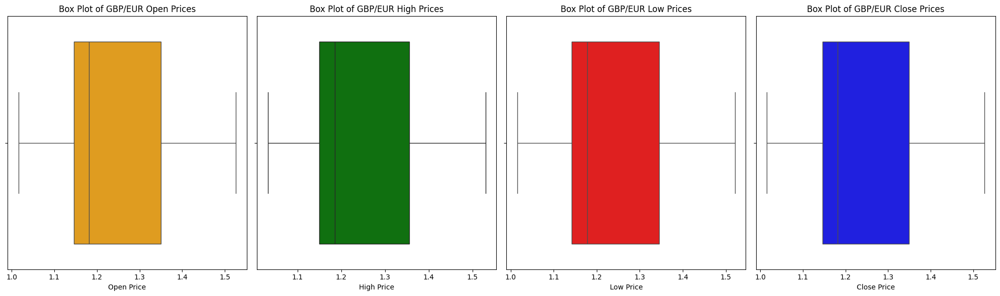

In [ ]:

# Create a Sub DataFrame for the box plots
data_to_plot =cleaned_forex_df[['Open', 'High', 'Low', 'Close']]

# Create a figure with 4 horizontal box plots
fig, axs = plt.subplots(1, 4, figsize=(20, 6))

# box plot for 'Open' prices
sns.boxplot(data=data_to_plot['Open'], ax=axs[0], color='orange', orient='h')
axs[0].set_title('Box Plot of GBP/EUR Open Prices')
axs[0].set_xlabel('Open Price')

# box plot for 'High' prices
sns.boxplot(data=data_to_plot['High'], ax=axs[1], color='green', orient='h')
axs[1].set_title('Box Plot of GBP/EUR High Prices')
axs[1].set_xlabel('High Price')

# box plot for 'Low' prices
sns.boxplot(data=data_to_plot['Low'], ax=axs[2], color='red', orient='h')
axs[2].set_title('Box Plot of GBP/EUR Low Prices')
axs[2].set_xlabel('Low Price')

# box plot for 'Close' prices
sns.boxplot(data=data_to_plot['Close'], ax=axs[3], color='blue', orient='h')
axs[3].set_title('Box Plot of GBP/EUR Close Prices')
axs[3].set_xlabel('Close Price')

# adjust subplot parameters to give specified padding
plt.tight_layout()

# Show the plot
plt.show()


Box plots show that there is no outlier in any of the columns

**Visualizing the prices over the past 20 years to understand prices trends**

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 4))

# Plotting each price type as a line
plt.plot(cleaned_forex_df['Date'], cleaned_forex_df['Open'], label='Open Price', color='orange', linewidth=1.5)
plt.plot(cleaned_forex_df['Date'], cleaned_forex_df['High'], label='High Price', color='green', linewidth=1.5)
plt.plot(cleaned_forex_df['Date'], cleaned_forex_df['Low'], label='Low Price', color='red', linewidth=1.5)
plt.plot(cleaned_forex_df['Date'], cleaned_forex_df['Close'], label='Close Price', color='blue', linewidth=1.5)

# Adding title and labels
plt.title('GBP/EUR Prices Trend for the past 20 years')
plt.xlabel('Date')
plt.ylabel('Price')

# Adding legend
plt.legend()

# Display the plot
plt.show()


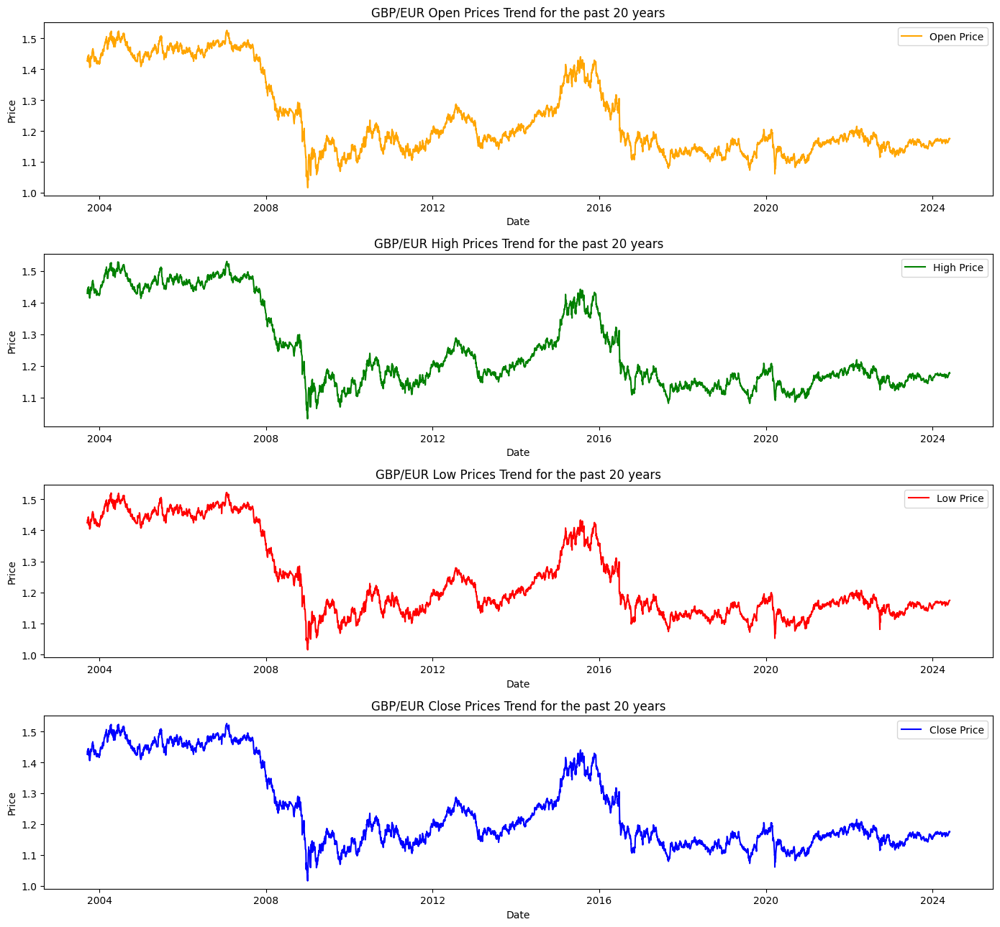

In [ ]:
# Create a figure with 4 subplots without sharing x-axis
fig, axs = plt.subplots(4, 1, figsize=(14, 13), sharex=False)

# Plot 'Open' prices
axs[0].plot(cleaned_forex_df['Date'], cleaned_forex_df['Open'], label='Open Price', color='orange')
axs[0].set_title('GBP/EUR Open Prices Trend for the past 20 years')
axs[0].set_ylabel('Price')
axs[0].set_xlabel('Date')
axs[0].legend()

# Plot 'High' prices
axs[1].plot(cleaned_forex_df['Date'], cleaned_forex_df['High'], label='High Price', color='green')
axs[1].set_title('GBP/EUR High Prices Trend for the past 20 years')
axs[1].set_ylabel('Price')
axs[1].set_xlabel('Date')
axs[1].legend()

# Plot 'Low' prices
axs[2].plot(cleaned_forex_df['Date'], cleaned_forex_df['Low'], label='Low Price', color='red')
axs[2].set_title('GBP/EUR Low Prices Trend for the past 20 years')
axs[2].set_ylabel('Price')
axs[2].set_xlabel('Date')
axs[2].legend()

# Plot 'Close' prices
axs[3].plot(cleaned_forex_df['Date'], cleaned_forex_df['Close'], label='Close Price', color='blue')
axs[3].set_title('GBP/EUR Close Prices Trend for the past 20 years')
axs[3].set_ylabel('Price')
axs[3].set_xlabel('Date')
axs[3].legend()

# Automatically adjust subplot parameters to give specified padding
plt.tight_layout()

# Show the plot
plt.show()



All four plots show a similar pattern of price movement, indicating that the opening, high, low, and closing prices are correlated.
There are significant fluctuations in prices around the 2008 due to financial crisis. After 2016, there is a notable downward trend, followed by a stabilization in recent years.
The charts highlighting the substantial impact of the global financial turmoil on the GBP/EUR currency pair.

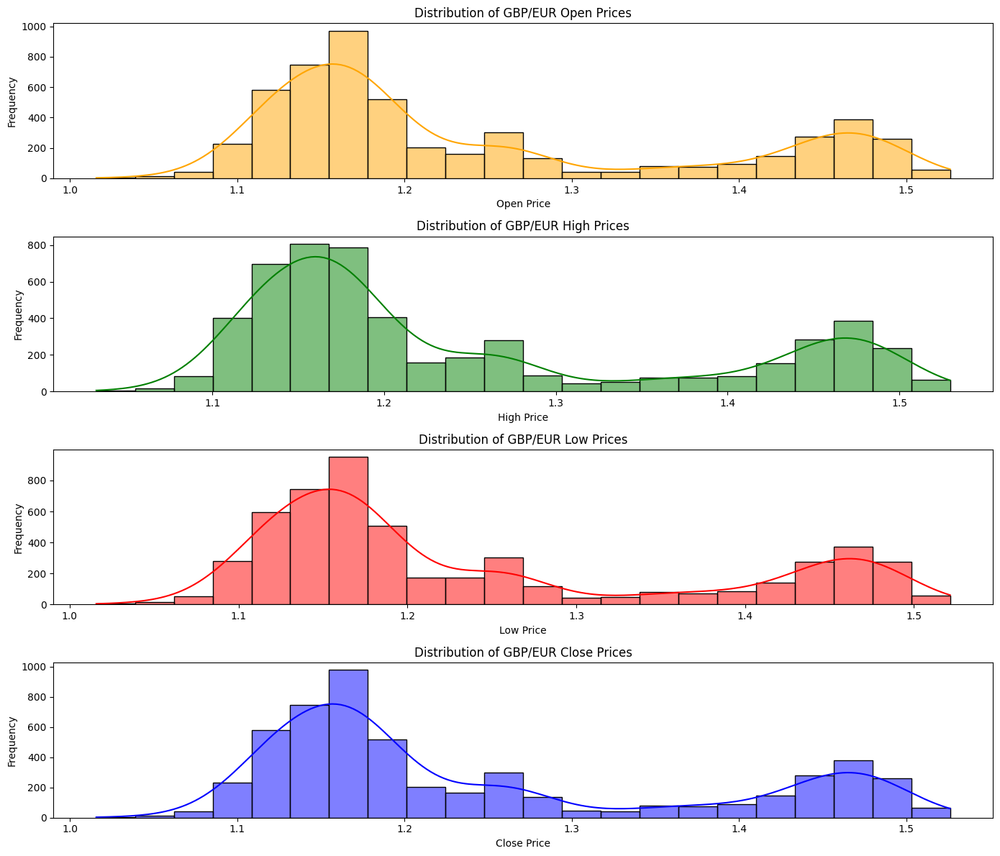

In [ ]:
# using histogram to understand the distribution of prices of interest, Open, High, Low and Close.
"""Kernel Density Estimate(KDE) adds a smooth curve over the histogram, giving a
 continuous estimation of the probability density function of the data """

# Figure for the subplots
fig, axs = plt.subplots(4, 1, figsize=(14, 12))
# Plot histogram for 'Open' prices
sns.histplot(cleaned_forex_df['Open'], kde=True, ax=axs[0], color='orange')
axs[0].set_title('Distribution of GBP/EUR Open Prices')
axs[0].set_xlabel('Open Price')
axs[0].set_ylabel('Frequency')

# Plot histogram for 'High' prices
sns.histplot(cleaned_forex_df['High'], kde=True, ax=axs[1], color='green')
axs[1].set_title('Distribution of GBP/EUR High Prices')
axs[1].set_xlabel('High Price')
axs[1].set_ylabel('Frequency')

# Plot histogram for 'Low' prices
sns.histplot(cleaned_forex_df['Low'], kde=True, ax=axs[2], color='red')
axs[2].set_title('Distribution of GBP/EUR Low Prices')
axs[2].set_xlabel('Low Price')
axs[2].set_ylabel('Frequency')

# Plot histogram for 'Close' prices
sns.histplot(cleaned_forex_df['Close'], kde=True, ax=axs[3], color='blue')
axs[3].set_title('Distribution of GBP/EUR Close Prices')
axs[3].set_xlabel('Close Price')
axs[3].set_ylabel('Frequency')

# adjust subplot parameters to give specified padding
plt.tight_layout()

# Show the plot
plt.show()


All histograms show a bimodal distribution(2 peaks)

The first peak is between 1.1 and 1.2 and is slightly skewed to the right.
The second peak is between 1.4 and 1.5 and appears to be more symmetric(tending to be normally distributed).

# **Feature Engineering**

**Adding technical indicators to better understand market dynamics and make informed trading decisions.**

In [ ]:
# Exponential Moving Average (EMA) with periods of 50 and 200 to address both short-term and long-term trends

def calculate_ema(df, span):
    """
    Calculate the Exponential Moving Average (EMA).

    Parameters:
    df (pandas DataFrame): The original dataframe.
    span (int): The span for the EMA.

    Returns:
    pandas Series: The EMA of the close prices.
    """
    return df['Close'].ewm(span=span, adjust=False).mean()

# Calculate EMA 50 and EMA 200
cleaned_forex_df.loc[:,'EMA_50'] = calculate_ema(cleaned_forex_df, span=50)
cleaned_forex_df.loc[:,'EMA_200'] = calculate_ema(cleaned_forex_df, span=200)



# # Moving Average Convergence Divergence (MACD) to analyze both short-term and long-term market momentum
def calculate_macd(df, short_span=12, long_span=26, signal_span=9):
    """
    Calculate the MACD, Signal Line, and MACD Histogram.

    Parameters:
    df (pandas DataFrame): The original dataframe.
    short_span (int): The span for the short-term EMA.
    long_span (int): The span for the long-term EMA.
    signal_span (int): The span for the Signal line.

    Returns:
    pandas DataFrame: The MACD, Signal line, and MACD Histogram.
    """
    short_ema = df['Close'].ewm(span=short_span, adjust=False).mean()
    long_ema = df['Close'].ewm(span=long_span, adjust=False).mean()
    macd = short_ema - long_ema
    signal = macd.ewm(span=signal_span, adjust=False).mean()
    macd_histogram = macd - signal
    return pd.DataFrame({'MACD': macd, 'Signal': signal, 'MACD_Histogram': macd_histogram})

# Calculate MACD, Signal Line, and MACD Histogram
macd_df = calculate_macd(cleaned_forex_df)

# Add these components to the original DataFrame
cleaned_forex_df.loc[:,'MACD'] = macd_df['MACD']
cleaned_forex_df.loc[:, 'MACD_Signal'] = macd_df['Signal']
cleaned_forex_df.loc[:,'MACD_Histogram'] = macd_df['MACD_Histogram']



# Relative Strength Index (RSI) to evaluate both short-term and long-term market strength and momentum
def calculate_rsi(df, window=14):
    delta = df['Close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

# Calculate RSI
cleaned_forex_df.loc[:,'RSI'] = calculate_rsi(cleaned_forex_df)



#Average Directional Index (ADX) to measure both short-term and long-term market trend strength
def calculate_adx(df, window=14):
    """
    Calculate the Average Directional Index (ADX).

    Parameters:
    df (pandas DataFrame): The original dataframe.
    window (int): The period for calculating the ADX.

    Returns:
    pandas DataFrame: The ADX, plus directional indicator (DI+), and minus directional indicator (DI-).
    """
    high = df['High']
    low = df['Low']
    close = df['Close']

    # Calculate True Range (TR)
    tr1 = high - low
    tr2 = abs(high - close.shift(1))
    tr3 = abs(low - close.shift(1))
    tr = pd.concat([tr1, tr2, tr3], axis=1).max(axis=1)

    # Calculate directional movements
    plus_dm = high.diff()
    minus_dm = low.diff()

    plus_dm[plus_dm < 0] = 0
    minus_dm[minus_dm > 0] = 0

    # Smooth the TR, plus_dm, and minus_dm
    atr = tr.rolling(window=window, min_periods=1).mean()
    plus_di = 100 * (plus_dm.ewm(alpha=1/window).mean() / atr)
    minus_di = abs(100 * (minus_dm.ewm(alpha=1/window).mean() / atr))

    # Calculate the DX and ADX
    dx = (abs(plus_di - minus_di) / (plus_di + minus_di)) * 100
    adx = dx.ewm(alpha=1/window).mean()

    return pd.DataFrame({'ADX': adx, 'Plus_DI': plus_di, 'Minus_DI': minus_di})

# Calculate ADX, Plus_DI, and Minus_DI
adx_df = calculate_adx(cleaned_forex_df)

# Add these components to the original DataFrame
cleaned_forex_df.loc[:,'ADX'] = adx_df['ADX']
cleaned_forex_df.loc[:,'Plus_DI'] = adx_df['Plus_DI']
cleaned_forex_df.loc[:,'Minus_DI'] = adx_df['Minus_DI']

# Drop rows with NaN value at the beginning of the dataset
cleaned_forex_df.dropna(inplace=True)


# Display the first few rows of the DataFrame to verify the dropped rows
cleaned_forex_df.head()

,Date,Open,High,Low,Close,EMA_50,EMA_200,MACD,MACD_Signal,MACD_Histogram,RSI,ADX,Plus_DI,Minus_DI
13,2003-10-06,1.4362,1.4386,1.4243,1.4257,1.429398,1.427151,0.000650,0.001744,-0.001094,49.722222,50.072265,25.210758,21.799990
14,2003-10-07,1.4251,1.4304,1.4098,1.4114,1.428692,1.426995,-0.001002,0.001194,-0.002197,41.483198,46.927863,20.239342,31.423958
15,2003-10-08,1.4116,1.4139,1.4046,1.4059,1.427798,1.426785,-0.002724,0.000411,-0.003135,30.778739,45.023083,18.663290,33.935317
16,2003-10-09,1.4061,1.4229,1.4040,1.4192,1.427461,1.426709,-0.002980,-0.000267,-0.002713,40.425532,41.486838,23.375060,28.942339
17,2003-10-10,1.4190,1.4203,1.4083,1.4102,1.426784,1.426545,-0.003866,-0.000987,-0.002879,37.328094,38.410960,20.517102,25.403697


In [ ]:
#Display shape of dataset
cleaned_forex_df.shape

(5360, 14)

Filtering the data set to the last three years for better visualisation of the indicators.

In [ ]:
# Filter data for the past three years
three_years_prices = cleaned_forex_df['Date'].max() - pd.DateOffset(years=3)
df_last_three_years = cleaned_forex_df[cleaned_forex_df['Date'] >= three_years_prices]
df_last_three_years.head()

,Date,Open,High,Low,Close,EMA_50,EMA_200,MACD,MACD_Signal,MACD_Histogram,RSI,ADX,Plus_DI,Minus_DI
4618,2021-05-31,1.16310,1.16388,1.16050,1.16314,1.157217,1.139960,0.001130,0.000848,0.000283,48.898116,12.151276,26.123530,19.765260
4619,2021-06-01,1.16282,1.16447,1.15640,1.16296,1.157443,1.140189,0.001270,0.000932,0.000338,48.553259,11.503596,24.085034,22.644024
4620,2021-06-02,1.15846,1.16265,1.15757,1.15853,1.157485,1.140372,0.001012,0.000948,0.000064,42.171717,10.902179,22.123734,20.800069
4621,2021-06-03,1.16063,1.16453,1.15985,1.16056,1.157606,1.140572,0.000960,0.000951,0.000010,46.675787,10.713689,22.580354,19.133413
4622,2021-06-04,1.16288,1.16733,1.16250,1.16300,1.157817,1.140796,0.001103,0.000981,0.000122,53.483269,11.056005,23.667516,17.313026


**Plots of the four technical indicators used in the study**

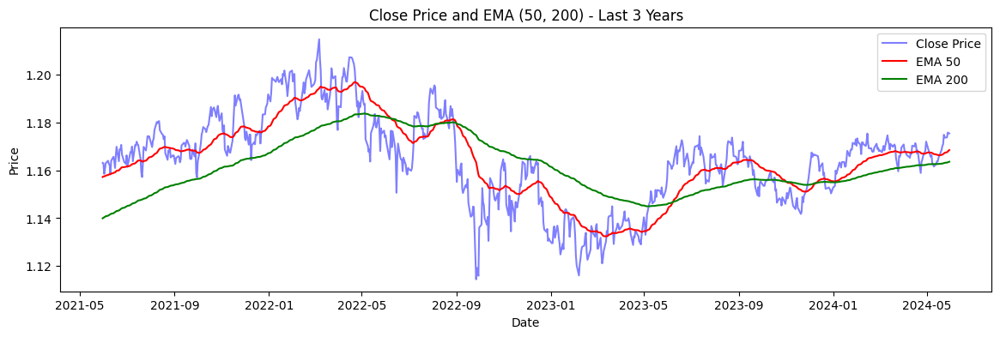

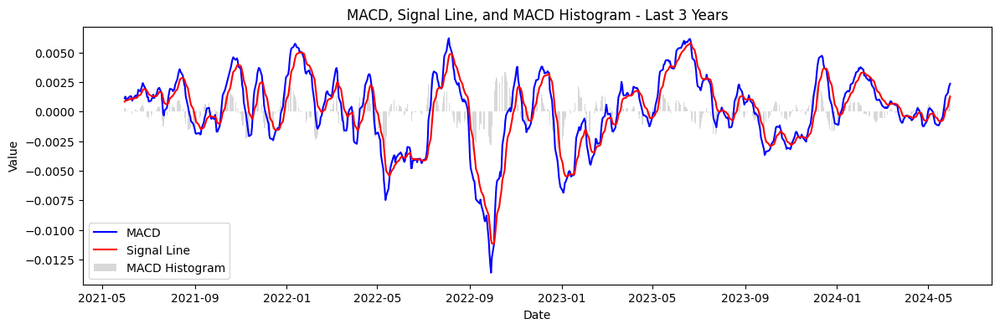

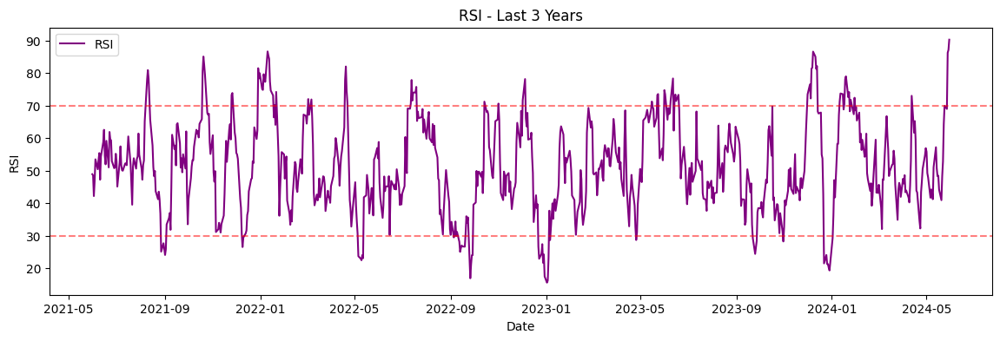

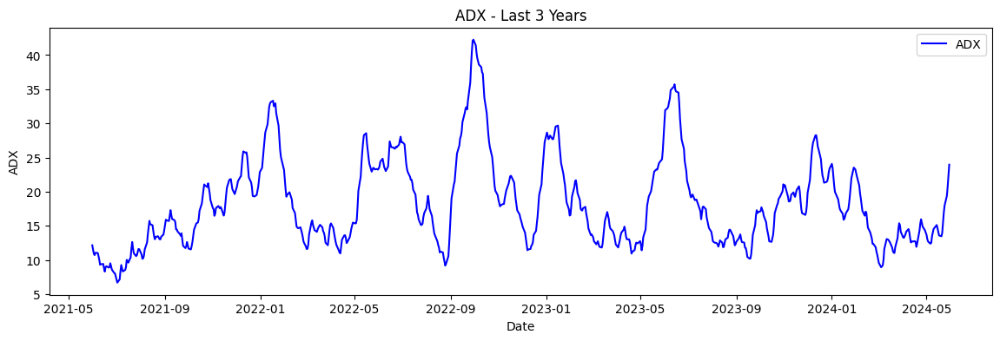

In [ ]:
# Plot EMA
def plot_ema(df):
    """
    Plot the closing price along with EMA 50 and EMA 200.

    Parameters:
    df (DataFrame): DataFrame with 'Date', 'Close', 'EMA_50', and 'EMA_200' columns.
    """
    plt.figure(figsize=(14, 4))
    plt.plot(df['Date'], df['Close'], label='Close Price', color='blue', alpha=0.5)
    plt.plot(df['Date'], df['EMA_50'], label='EMA 50', color='red')
    plt.plot(df['Date'], df['EMA_200'], label='EMA 200', color='green')
    plt.title('Close Price and EMA (50, 200) - Last 3 Years')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

plot_ema(df_last_three_years)

# Plot MACD
def plot_macd(df):
    """
    Plot MACD, Signal Line, and MACD Histogram.

    Parameters:
    df (DataFrame): DataFrame with 'Date', 'MACD', 'MACD_Signal', and 'MACD_Histogram' columns.
    """
    plt.figure(figsize=(14, 4))
    plt.plot(df['Date'], df['MACD'], label='MACD', color='blue')
    plt.plot(df['Date'], df['MACD_Signal'], label='Signal Line', color='red')
    plt.bar(df['Date'], df['MACD_Histogram'], label='MACD Histogram', color='gray', alpha=0.3)
    plt.title('MACD, Signal Line, and MACD Histogram - Last 3 Years')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

plot_macd(df_last_three_years)

# Plot RSI
def plot_rsi(df):
    """
    Plot the RSI with overbought and oversold lines.

    Parameters:
    df (DataFrame): DataFrame with 'Date' and 'RSI' columns.
    """
    plt.figure(figsize=(14, 4))
    plt.plot(df['Date'], df['RSI'], label='RSI', color='purple')
    plt.axhline(30, linestyle='--', alpha=0.5, color='red')
    plt.axhline(70, linestyle='--', alpha=0.5, color='red')
    plt.title('RSI - Last 3 Years')
    plt.xlabel('Date')
    plt.ylabel('RSI')
    plt.legend()
    plt.show()

plot_rsi(df_last_three_years)

# Plot ADX
def plot_adx(df):
    """
    Plot the ADX.

    Parameters:
    df (DataFrame): DataFrame with 'Date' and 'ADX' columns.
    """
    plt.figure(figsize=(14, 4))
    plt.plot(df['Date'], df['ADX'], label='ADX', color='blue')
    #plt.plot(df['Date'], df['Plus_DI'], label='Plus DI', color='green')
    #plt.plot(df['Date'], df['Minus_DI'], label='Minus DI', color='red')
    plt.title('ADX - Last 3 Years')
    plt.xlabel('Date')
    plt.ylabel('ADX')
    plt.legend()
    plt.show()

plot_adx(df_last_three_years)


**Checking out relationships between Prices and Indictors using correlation map and Corner plot**

Correlation Matrix

In [ ]:
indicators = cleaned_forex_df[['Open','High', 'Low', 'Close', 'EMA_50', 'EMA_200', 'MACD', 'MACD_Signal', 'MACD_Histogram', 'RSI', 'ADX', 'Plus_DI', 'Minus_DI']]

# Calculate the correlation matrix
correlation_matrix = indicators.corr()

# Display the correlation matrix
correlation_matrix


,Open,High,Low,Close,EMA_50,EMA_200,MACD,MACD_Signal,MACD_Histogram,RSI,ADX,Plus_DI,Minus_DI
Open,1.000000,0.999575,0.999504,0.999599,0.989441,0.955766,0.106554,0.111503,0.007085,0.067560,0.083503,0.042413,-0.057127
High,0.999575,1.000000,0.999338,0.999564,0.989732,0.956914,0.102799,0.107504,0.007042,0.066714,0.087726,0.045250,-0.059134
Low,0.999504,0.999338,1.000000,0.999531,0.988697,0.954224,0.108630,0.113200,0.008630,0.070012,0.079412,0.047265,-0.062775
Close,0.999599,0.999564,0.999531,1.000000,0.989092,0.955349,0.107607,0.111537,0.010316,0.071408,0.082768,0.045733,-0.060480
EMA_50,0.989441,0.989732,0.988697,0.989092,1.000000,0.979773,-0.029805,-0.011962,-0.058905,-0.037607,0.129580,-0.054184,0.044490
EMA_200,0.955766,0.956914,0.954224,0.955349,0.979773,1.000000,-0.111594,-0.109808,-0.028051,-0.066882,0.170346,-0.076282,0.099267
MACD,0.106554,0.102799,0.108630,0.107607,-0.029805,-0.111594,1.000000,0.948852,0.355415,0.687510,-0.325195,0.608050,-0.633788
MACD_Signal,0.111503,0.107504,0.113200,0.111537,-0.011962,-0.109808,0.948852,1.000000,0.042129,0.495578,-0.335454,0.480071,-0.523278
MACD_Histogram,0.007085,0.007042,0.008630,0.010316,-0.058905,-0.028051,0.355415,0.042129,1.000000,0.708469,-0.035965,0.502925,-0.456454
RSI,0.067560,0.066714,0.070012,0.071408,-0.037607,-0.066882,0.687510,0.495578,0.708469,1.000000,-0.146697,0.678265,-0.657802


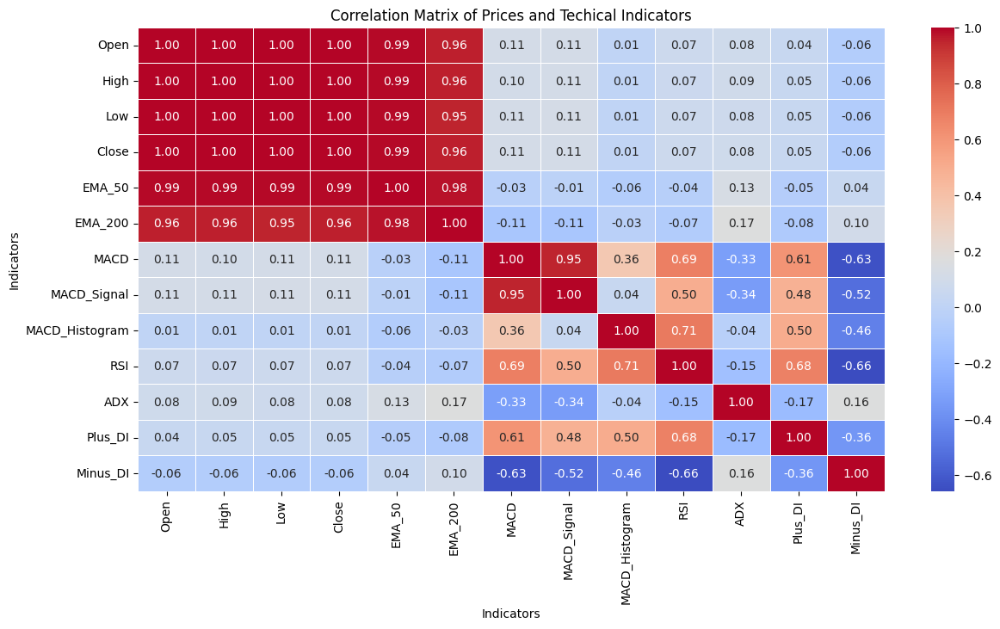

In [ ]:
# Set up the matplotlib figure
plt.figure(figsize=(14, 7))

# Draw the heatmap with the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)

# Add titles and labels
plt.title('Correlation Matrix of Prices and Techical Indicators')
plt.xlabel('Indicators')
plt.ylabel('Indicators')

# Show the plot
plt.show()


Corner plot

<Figure size 800x500 with 0 Axes>

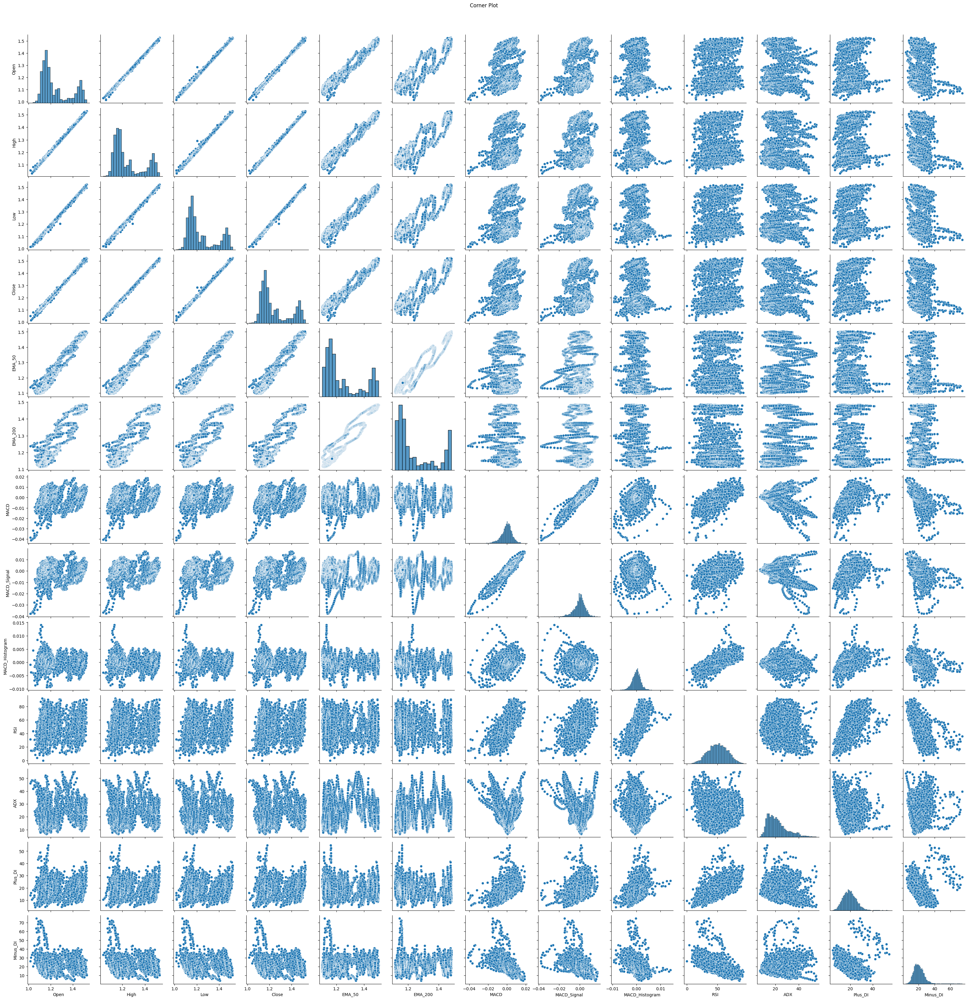

In [ ]:
# Genrate corner plot to show relationships and distributions of prices and indicators
fig = plt.figure(figsize=(8, 5))
corner_plot = sns.pairplot(cleaned_forex_df)
corner_plot.fig.suptitle('Corner Plot', y=1.02)
plt.show()

Cleaning data up in preparation for data modelling.

In [ ]:
#check the first five rows of the dataframe
cleaned_forex_df.head()

,Date,Open,High,Low,Close,EMA_50,EMA_200,MACD,MACD_Signal,MACD_Histogram,RSI,ADX,Plus_DI,Minus_DI
13,2003-10-06,1.4362,1.4386,1.4243,1.4257,1.429398,1.427151,0.000650,0.001744,-0.001094,49.722222,50.072265,25.210758,21.799990
14,2003-10-07,1.4251,1.4304,1.4098,1.4114,1.428692,1.426995,-0.001002,0.001194,-0.002197,41.483198,46.927863,20.239342,31.423958
15,2003-10-08,1.4116,1.4139,1.4046,1.4059,1.427798,1.426785,-0.002724,0.000411,-0.003135,30.778739,45.023083,18.663290,33.935317
16,2003-10-09,1.4061,1.4229,1.4040,1.4192,1.427461,1.426709,-0.002980,-0.000267,-0.002713,40.425532,41.486838,23.375060,28.942339
17,2003-10-10,1.4190,1.4203,1.4083,1.4102,1.426784,1.426545,-0.003866,-0.000987,-0.002879,37.328094,38.410960,20.517102,25.403697


In [ ]:
# Confirm shape of the cleaned data set.
cleaned_forex_df.shape

(5360, 14)

In [ ]:
# Check for null values on the cleaned dataset.
cleaned_forex_df.isnull().sum()

,0
Date,0
Open,0
High,0
Low,0
Close,0
EMA_50,0
EMA_200,0
MACD,0
MACD_Signal,0
MACD_Histogram,0


Adding 1000 more sample points using the jittering method to enhance the robustness of the GRU model

In [ ]:
# Function to add data points to the original data in form of noise
def jitter(data, noise_level=0.01):
    """
    Add random noise to the data.

    This function introduces variability into the data by adding random noise,
    which can help in augmenting the dataset to make the model more robust.

    Parameters:
    data (numpy array): Numeric data to which noise will be added.
    noise_level (float): The standard deviation of the normal distribution from which the noise is generated.

    Returns:
    numpy array: Data with added noise.
    """
    noise = np.random.normal(0, noise_level, data.shape)
    return data + noise


# Function to resample and jitter noise.
def resample_and_jitter(df, n_samples):
    """
    Resample the dataframe and add jitter (random noise) to the numeric columns.

    This function increases the size of the dataset by resampling with replacement and
    adding jitter to numeric columns. This augmentation technique helps in creating
    additional synthetic data points, which can improve the training of models
    by providing more varied data.

    Parameters:
    df (DataFrame): The input dataframe to be resampled and jittered.
    n_samples (int): The number of samples to draw with replacement from the dataframe.

    Returns:
    DataFrame: Resampled dataframe with added jitter to numeric columns.
    """

    # Resample the dataframe with replacement
    resampled_df = df.sample(n=n_samples, replace=True).reset_index(drop=True)
    for column in resampled_df.select_dtypes(include=[np.number]).columns:
        resampled_df[column] = jitter(resampled_df[column].values)
    return resampled_df

# Number of additional samples to generate
additional_samples = 1000

# Generate additional samples
df_resampled = resample_and_jitter(cleaned_forex_df, additional_samples)

# Combine the original and resampled dataframes
augmented_df = pd.concat([cleaned_forex_df, df_resampled], ignore_index=True)
augmented_df.head()

,Date,Open,High,Low,Close,EMA_50,EMA_200,MACD,MACD_Signal,MACD_Histogram,RSI,ADX,Plus_DI,Minus_DI
0,2003-10-06,1.4362,1.4386,1.4243,1.4257,1.429398,1.427151,0.000650,0.001744,-0.001094,49.722222,50.072265,25.210758,21.799990
1,2003-10-07,1.4251,1.4304,1.4098,1.4114,1.428692,1.426995,-0.001002,0.001194,-0.002197,41.483198,46.927863,20.239342,31.423958
2,2003-10-08,1.4116,1.4139,1.4046,1.4059,1.427798,1.426785,-0.002724,0.000411,-0.003135,30.778739,45.023083,18.663290,33.935317
3,2003-10-09,1.4061,1.4229,1.4040,1.4192,1.427461,1.426709,-0.002980,-0.000267,-0.002713,40.425532,41.486838,23.375060,28.942339
4,2003-10-10,1.4190,1.4203,1.4083,1.4102,1.426784,1.426545,-0.003866,-0.000987,-0.002879,37.328094,38.410960,20.517102,25.403697


In [ ]:
# Verify the dimensions of the augmented dataset to ensure correct augmentation
augmented_df.shape

(6360, 14)

In [ ]:
# Get summary statistics of the augmented data
augmented_df.describe()

,Date,Open,High,Low,Close,EMA_50,EMA_200,MACD,MACD_Signal,MACD_Histogram,RSI,ADX,Plus_DI,Minus_DI
count,6360,6360.000000,6360.000000,6360.000000,6360.000000,6360.000000,6360.000000,6360.000000,6360.000000,6360.000000,6360.000000,6360.000000,6360.000000,6360.000000
mean,2014-02-07 04:59:32.830188544,1.242478,1.246405,1.238263,1.242373,1.243628,1.247172,-0.000358,-0.000315,-0.000115,50.199275,21.577438,19.508090,20.720279
min,2003-10-06 00:00:00,1.015700,1.032400,1.015700,1.015700,1.082779,1.093973,-0.041236,-0.044726,-0.025659,-0.013993,6.682093,4.272195,3.974481
25%,2009-01-05 00:00:00,1.145465,1.149475,1.141700,1.145700,1.145768,1.149796,-0.003818,-0.003687,-0.001372,39.207513,15.083680,15.199324,15.939213
50%,2014-02-17 12:00:00,1.182000,1.186295,1.178065,1.182000,1.179070,1.182122,0.000280,0.000282,0.000037,50.196732,19.802603,19.128791,19.915129
75%,2019-04-09 06:00:00,1.347625,1.351695,1.342009,1.346425,1.358818,1.353342,0.003823,0.003569,0.001291,61.555516,25.857474,23.247586,24.353965
max,2024-05-30 00:00:00,1.539807,1.533015,1.522407,1.538326,1.513129,1.502792,0.035615,0.032543,0.040156,92.187500,55.128315,54.906334,74.671398
std,NaN,0.130148,0.130100,0.129847,0.129958,0.129084,0.126094,0.007516,0.007136,0.004492,15.689454,8.511560,6.074212,7.155330


,Date,Open,High,Low,Close,EMA_50,EMA_200,MACD,MACD_Signal,MACD_Histogram,RSI,ADX,Plus_DI,Minus_DI
count,5360,5360.000000,5360.000000,5360.000000,5360.000000,5360.000000,5360.000000,5360.000000,5360.000000,5.360000e+03,5360.000000,5360.000000,5360.000000,5360.000000
mean,2014-02-10 21:24:10.746268672,1.242401,1.246415,1.238243,1.242376,1.243569,1.247268,-0.000343,-0.000342,-5.443901e-07,50.275171,21.524771,19.515974,20.667871
min,2003-10-06 00:00:00,1.015700,1.032400,1.015700,1.015700,1.097439,1.114595,-0.041236,-0.037740,-9.353089e-03,0.000000,6.682093,4.272195,3.974481
25%,2008-12-29 18:00:00,1.145595,1.149495,1.141300,1.145600,1.145794,1.149658,-0.003378,-0.003174,-1.102898e-03,39.191987,15.038272,15.265371,15.965960
50%,2014-02-18 12:00:00,1.181495,1.185655,1.177590,1.181555,1.178362,1.182035,0.000289,0.000324,5.897261e-05,50.408761,19.747609,19.147867,19.897931
75%,2019-04-11 06:00:00,1.346400,1.350850,1.340793,1.346425,1.358130,1.353951,0.003482,0.003159,1.146611e-03,61.664131,25.836343,23.243162,24.280666
max,2024-05-30 00:00:00,1.526200,1.529500,1.521400,1.526200,1.503794,1.484090,0.018794,0.017209,1.413437e-02,92.187500,55.128315,54.906334,74.671398
std,NaN,0.130136,0.130218,0.129980,0.130102,0.129137,0.126100,0.006272,0.005868,1.981974e-03,15.650205,8.496628,6.049170,7.075659


In [ ]:
# Filter data for the past three years to enhance visualization comparison

# Filter the original data for the past three years
three_years_prices = cleaned_forex_df['Date'].max() - pd.DateOffset(years=3)
df_last_three_years = cleaned_forex_df[cleaned_forex_df['Date'] >= three_years_prices]
df_last_three_years.head()

,Date,Open,High,Low,Close,EMA_50,EMA_200,MACD,MACD_Signal,MACD_Histogram,RSI,ADX,Plus_DI,Minus_DI
4618,2021-05-31,1.16310,1.16388,1.16050,1.16314,1.157217,1.139960,0.001130,0.000848,0.000283,48.898116,12.151276,26.123530,19.765260
4619,2021-06-01,1.16282,1.16447,1.15640,1.16296,1.157443,1.140189,0.001270,0.000932,0.000338,48.553259,11.503596,24.085034,22.644024
4620,2021-06-02,1.15846,1.16265,1.15757,1.15853,1.157485,1.140372,0.001012,0.000948,0.000064,42.171717,10.902179,22.123734,20.800069
4621,2021-06-03,1.16063,1.16453,1.15985,1.16056,1.157606,1.140572,0.000960,0.000951,0.000010,46.675787,10.713689,22.580354,19.133413
4622,2021-06-04,1.16288,1.16733,1.16250,1.16300,1.157817,1.140796,0.001103,0.000981,0.000122,53.483269,11.056005,23.667516,17.313026


In [ ]:
# Filter the augmented data for the past three years
three_years_augmented_prices = augmented_df['Date'].max() - pd.DateOffset(years=3)
augmented_df_last_three_years = augmented_df[augmented_df['Date'] >= three_years_prices]
augmented_df_last_three_years.head()

,Date,Open,High,Low,Close,EMA_50,EMA_200,MACD,MACD_Signal,MACD_Histogram,RSI,ADX,Plus_DI,Minus_DI
4576,2021-05-31,1.16310,1.16388,1.16050,1.16314,1.157217,1.139960,0.001130,0.000848,0.000283,48.898116,12.151276,26.123530,19.765260
4577,2021-06-01,1.16282,1.16447,1.15640,1.16296,1.157443,1.140189,0.001270,0.000932,0.000338,48.553259,11.503596,24.085034,22.644024
4578,2021-06-02,1.15846,1.16265,1.15757,1.15853,1.157485,1.140372,0.001012,0.000948,0.000064,42.171717,10.902179,22.123734,20.800069
4579,2021-06-03,1.16063,1.16453,1.15985,1.16056,1.157606,1.140572,0.000960,0.000951,0.000010,46.675787,10.713689,22.580354,19.133413
4580,2021-06-04,1.16288,1.16733,1.16250,1.16300,1.157817,1.140796,0.001103,0.000981,0.000122,53.483269,11.056005,23.667516,17.313026


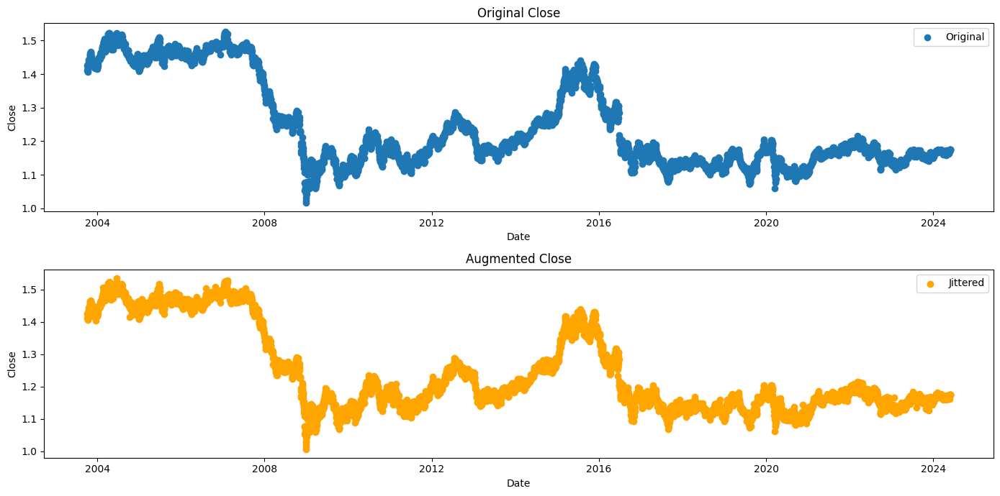

In [ ]:
# Plot original and augmented data for comparison using the close column

def plot_comparison(df_original, df_augmented, column_name):
    """
    Function to visually compare the original dataset  and jittered version of the same dataset to show the distribution of the data sets

    Parameters:
    df_original: The original dataset containing a 'Date' column and the specified column of interest.
    df_jittered: The jittered or modified dataset, with the same structure as df_original, including a 'Date' column and the specified column of interest.
    column_name (str): The name of the column to be compared between the original and jittered datasets(Close)

    Returns:
    None: Generates and displays a visual comparison of the close column between the original and jittered datasets using scattered plot.
    """


    plt.figure(figsize=(14, 7))

    plt.subplot(2, 1, 1)
    plt.scatter(df_original['Date'], df_original[column_name], label='Original')
    plt.title(f'Original {column_name}')
    plt.xlabel('Date')
    plt.ylabel(column_name)
    plt.legend()

    plt.subplot(2, 1, 2)
    plt.scatter(df_augmented['Date'], df_augmented[column_name], label='Jittered', color='orange')
    plt.title(f'Augmented {column_name}')
    plt.xlabel('Date')
    plt.ylabel(column_name)
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_comparison(cleaned_forex_df, augmented_df, 'Close')


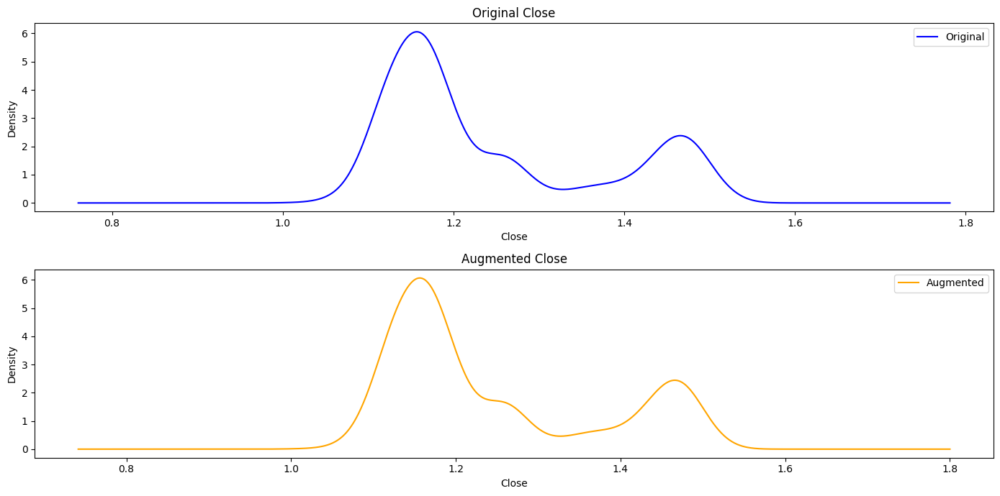

In [ ]:
# Function to plot density comparison between the original and augmented datasets

def plot_density(df_original, df_augmented, column_name):
    """
    Function to plot the density comparison of a specified column between the original
    and jittered datasets. This helps in visualizing the distribution of the data.

    Parameters:
    df_original (pandas.DataFrame): The original dataset containing the specified column of interest.
    df_jittered (pandas.DataFrame): The jittered dataset containing the same specified column of interest.
    column_name (str): The name of the column to be compared between the original and jittered datasets.

    Returns:
    None: Generates and displays density plots for the specified column from both datasets.
    """

    plt.figure(figsize=(14, 7))

    # Density plot for original data
    plt.subplot(2, 1, 1)
    df_original[column_name].plot(kind='density', label='Original', color='blue')
    plt.title(f'Original {column_name}')
    plt.xlabel(column_name)
    plt.legend()

    # Density plot for jittered data
    plt.subplot(2, 1, 2)
    df_augmented[column_name].plot(kind='density', label='Augmented', color='orange')
    plt.title(f'Augmented {column_name}')
    plt.xlabel(column_name)
    plt.legend()

    # Adjust layout and display plot
    plt.tight_layout()
    plt.show()

# Plot density comparison for the 'Close' column
plot_density(cleaned_forex_df, augmented_df, 'Close')


# **Modelling**

The models will use the closing price as the target variable because it represents the final trading price of the asset at the end of the trading day. This price is considered the most indicative of the asset's value for that day, as it encompasses all market activity and sentiment up to the market close.



In [ ]:
# Set random seeds for reproducibility
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

**Data Splitting for the Augmented dataset.**

In [ ]:

# Making a copy of the original cleaned_stock_data for version control
augmented_df_copy = augmented_df.copy()

# Setting Features and target of models

# Features includes all columns except 'Close' and 'Date'
aug_X_df = augmented_df_copy.drop(columns=['Close', 'Date']).values

# The 'Close' price is the target column
aug_Y_df = augmented_df_copy[['Close']].values
aug_dates = augmented_df_copy['Date'].values

# Splitting the dataset to Train and temp sets
aug_X_train, aug_X_temp, aug_Y_train, aug_Y_temp, aug_train_dates, aug_temp_dates = train_test_split(aug_X_df, aug_Y_df, aug_dates, test_size=0.3, shuffle=False)

# Sub-dividing the temp set to Validation and Test set
aug_X_val, aug_X_test, aug_Y_val, aug_Y_test, aug_val_dates, aug_test_dates = train_test_split(aug_X_temp, aug_Y_temp, aug_temp_dates, test_size=0.5, shuffle=False)


print(f"Training set: {aug_X_train.shape}, {aug_Y_train.shape}")
print(f"Validation set: {aug_X_val.shape}, {aug_Y_val.shape}")
print(f"Test set: {aug_X_test.shape}, {aug_Y_test.shape}")
print()
print(f"Train_dates set: {aug_train_dates.shape}")
print(f"Val_dates set: {aug_val_dates.shape}")
print(f"Test_dates set: {aug_test_dates.shape}")


Training set: (4452, 12), (4452, 1)
Validation set: (954, 12), (954, 1)
Test set: (954, 12), (954, 1)

Train_dates set: (4452,)
Val_dates set: (954,)
Test_dates set: (954,)


**Normalization, feature scaling and sequence creation.**

In [ ]:
# Normalize the features and target dataset separately
aug_scaler_X = StandardScaler()
aug_scaler_y = StandardScaler()

aug_scaled_X_train = aug_scaler_X.fit_transform(aug_X_train)
aug_scaled_X_val = aug_scaler_X.transform(aug_X_val)
aug_scaled_X_test = aug_scaler_X.transform(aug_X_test)

aug_scaled_y_train = aug_scaler_y.fit_transform(aug_Y_train)
aug_scaled_y_val = aug_scaler_y.transform(aug_Y_val)
aug_scaled_y_test = aug_scaler_y.fit_transform(aug_Y_test)


# Function to create sequences
def create_sequences(data_X, data_Y, dates, sequence_length):
    """
    Function to create sequences from the dataset for time series forecasting.

    Parameters:
    data_X (pandas.DataFrame): The dataset containing the feature columns.
    data_y (pandas.DataFrame): The dataset containing the target column.
    sequence_length (int): The length of the sequences to be created.

    Returns:
    tuple: A tuple containing two numpy arrays:
        - sequences (numpy.ndarray): The array of sequences created from the feature dataset.
        - labels (numpy.ndarray): The array of labels corresponding to the sequences.
    """

    Xs=[]
    ys=[]
    ds = []

    for i in range(len(data_X) - sequence_length + 1):
        Xs.append(data_X[i:i+sequence_length])
        ys.append(data_Y[i+sequence_length] if i+sequence_length < len(data_Y) else data_Y[-1])
        ds.append(dates[i+sequence_length] if i+sequence_length  < len(dates) else dates[-1])
    return np.array(Xs), np.array(ys), np.array(ds)

# Define the sequence length
sequence_length = 15

# Create sequences for each set
aug_X_train_seq, aug_y_train_seq, aug_train_dates_seq = create_sequences(aug_scaled_X_train, aug_scaled_y_train, aug_train_dates, sequence_length)
aug_X_val_seq, aug_y_val_seq, aug_val_dates_seq = create_sequences(aug_scaled_X_val, aug_scaled_y_val, aug_val_dates, sequence_length)
aug_X_test_seq, aug_y_test_seq, aug_test_dates_seq = create_sequences(aug_scaled_X_test, aug_scaled_y_test, aug_test_dates, sequence_length)

# Reshape for X series (2 dimensions)
aug_X_train_gru = aug_X_train_seq
aug_X_val_gru = aug_X_val_seq
aug_X_test_gru = aug_X_test_seq

# Reshape for Y sequence(2 dimensions)
aug_Y_train_gru = aug_y_train_seq
aug_Y_val_gru = aug_y_val_seq
aug_Y_test_gru = aug_y_test_seq

print(f"GRU Training set: {aug_X_train_gru.shape}, {aug_Y_train_gru.shape}")
print(f"GRU Validation set: {aug_X_val_gru.shape}, {aug_Y_val_gru.shape}")
print(f"GRU Test set: {aug_X_test_gru.shape}, {aug_Y_test_gru.shape}")
print()

print(f"GRU Training set: {aug_train_dates_seq.shape}, {aug_train_dates_seq.shape}")
print(f"GRU Validation set: {aug_val_dates_seq.shape}, {aug_val_dates_seq.shape}")
print(f"GRU Test set: {aug_test_dates_seq.shape}, {aug_test_dates_seq.shape}")
print()

# checking the start and end dates for each sequence
print(f"Training sequences Dates: from {aug_train_dates_seq[0]} to {aug_train_dates_seq[-1]}")
print(f"Validation sequences Dates: from {aug_val_dates_seq[0]} to {aug_val_dates_seq[-1]}")
print(f"Test sequences Dates: from {aug_test_dates_seq[0]} to {aug_test_dates_seq[-1]}")

GRU Training set: (4438, 15, 12), (4438, 1)
GRU Validation set: (940, 15, 12), (940, 1)
GRU Test set: (940, 15, 12), (940, 1)

GRU Training set: (4438,), (4438,)
GRU Validation set: (940,), (940,)
GRU Test set: (940,), (940,)

Training sequences Dates: from 2003-10-27T00:00:00.000000000 to 2020-12-07T00:00:00.000000000
Validation sequences Dates: from 2020-12-29T00:00:00.000000000 to 2017-11-27T00:00:00.000000000
Test sequences Dates: from 2004-06-03T00:00:00.000000000 to 2014-12-12T00:00:00.000000000


# **GRU Modelling**

GRU Model building and Training for the augmented dataset.

In [ ]:
# Build the GRU model

model = Sequential()
model.add(GRU(units=50, return_sequences=True, input_shape=(aug_X_train_gru.shape[1], aug_X_train_gru.shape[2])))
model.add(Dropout(0.2))
model.add(GRU(units=50, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1))

# Compile the model with a specified learning rate
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error')
model.summary()

# Set up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(aug_X_train_gru, aug_Y_train_gru, epochs=100, batch_size=32, validation_data=(aug_X_val_gru, aug_Y_val_gru), callbacks=[early_stopping])

# Save the model
model.save('augmented_gru_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru (GRU)                            │ (None, 15, 50)              │           9,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 15, 50)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_1 (GRU)                          │ (None, 50)                  │          15,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,951 (97.46 KB)

 Trainable params: 24,951 (97.46 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2027 - val_loss: 0.0588
Epoch 2/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0283 - val_loss: 0.0598
Epoch 3/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0182 - val_loss: 0.0582
Epoch 4/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0160 - val_loss: 0.0574
Epoch 5/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0139 - val_loss: 0.0580
Epoch 6/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0130 - val_loss: 0.0593
Epoch 7/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0129 - val_loss: 0.0568
Epoch 8/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.0123 - val_loss: 0.0582
Epoch 9/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - loss: 0.0116 - val_loss: 0.0563
Epoch 10/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0115 - val_loss: 0.0572
Epoch 11/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0116 - val_loss: 0.0583
Epoch 12/100
139/139 ━━━━━━

Make prediction and Evaluation with the gru model on the Augmented dataset.

In [ ]:
# Make Predictions
y_pred = model.predict(aug_X_test_gru)

# Inverse transform predictions for evaluation
aug_y_test = aug_Y_test_gru.reshape(-1, 1)
aug_y_pred = y_pred.reshape(-1, 1)

# Adding back the columns removed before normalization
inverse_transform_data_test = np.hstack((np.zeros((aug_Y_test_gru.shape[0], aug_scaled_X_test.shape[1]-1)), aug_y_test))
inverse_transform_data_pred = np.hstack((np.zeros((aug_y_pred.shape[0], aug_scaled_X_test.shape[1]-1)), aug_y_pred))

# Inverse transform to get actual values
aug_y_test_actual = aug_scaler_y.inverse_transform(inverse_transform_data_test)[:, -1]
aug_y_pred_actual = aug_scaler_y.inverse_transform(inverse_transform_data_pred)[:, -1]

# Using R² to evaluate prediction
r2_train_data = r2_score(aug_Y_train_gru, model.predict(aug_X_train_gru).reshape(-1, 1))
r2_gru_aug = r2_score(aug_y_test_actual, aug_y_pred_actual)

print(f'R² Score for Training_data_set: {r2_train_data:.2f}')
print(f'R² Score for Prediction : {r2_gru_aug:.2f}')

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
R² Score for Training_data_set: 1.00
R² Score for Prediction : -0.18


Hyper-Parameter Tunning on the gru model on Augemented Dataset.

In [ ]:

def build_and_train_gru_model(X_train, Y_train, X_val, Y_val, input_shape, units, dropout_rate, learning_rate, epochs, batch_size):
    """
    Build and train a GRU model.

    Parameters:
    X_train_gru (np.ndarray): Training data for features.
    Y_train_seq (np.ndarray): Training data for target variable.
    X_val_gru (np.ndarray): Validation data for features.
    Y_val_seq (np.ndarray): Validation data for target variable.
    input_shape (tuple): Shape of the input data.
    units (int): Number of GRU units.
    dropout_rate (float): Dropout rate for regularization.
    learning_rate (float): Learning rate for the optimizer.
    epochs (int): Number of epochs to train the model.
    batch_size (int): Batch size for training.

    Returns:
    model (Sequential): Trained GRU model.
    history (History): Training history of the model.
    """

    model = Sequential()
    model.add(GRU(units=units, input_shape=input_shape, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='mse')

    history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=epochs, batch_size=batch_size, verbose=1)

    return model, history


#Hyperparameter grid
param_grid = {
    'units': [50, 64],
    'dropout_rate': [0.2, 0.3],
    'learning_rate': [0.001, 0.01],
    'batch_size': [32, 64],
    'epochs': [50, 100]
}

#Input shape
input_shape=(aug_X_train_gru.shape[1], aug_X_train_gru.shape[2])

# Initialize best score
best_score = float('-inf')
best_params = None
best_model = None

# Iterate over the hyperparameter grid
for units in param_grid['units']:
    for dropout_rate in param_grid['dropout_rate']:
        for learning_rate in param_grid['learning_rate']:
            for batch_size in param_grid['batch_size']:
                for epochs in param_grid['epochs']:
                    print(f"Training with units={units}, dropout_rate={dropout_rate}, learning_rate={learning_rate}, batch_size={batch_size}, epochs={epochs}")

                    model, history = build_and_train_gru_model(
                        aug_X_train_gru, aug_Y_train_gru, aug_X_val_gru, aug_Y_val_gru,
                        input_shape, units, dropout_rate, learning_rate, epochs, batch_size
                    )

                    y_pred = model.predict(aug_X_test_gru)

                    # Inverse transform predictions for evaluation
                    y_test = aug_Y_test_gru.reshape(-1, 1)
                    y_pred = aug_y_pred.reshape(-1, 1)

                    inverse_transform_data_test = np.hstack((np.zeros((aug_y_test_seq.shape[0], aug_scaled_X_test.shape[1]-1)), y_test))
                    inverse_transform_data_pred = np.hstack((np.zeros((y_pred.shape[0], aug_scaled_X_test.shape[1]-1)), y_pred))

                    y_test_actual = aug_scaler_y.inverse_transform(inverse_transform_data_test)[:, -1]
                    y_pred_actual = aug_scaler_y.inverse_transform(inverse_transform_data_pred)[:, -1]

                    # Evaluate model
                    r2 = r2_score(y_test_actual, y_pred_actual)
                    print(f"R² Score for current model: {r2:.2f}")

                    if r2 > best_score:
                        best_score = r2
                        best_params = {
                            'units': units,
                            'dropout_rate': dropout_rate,
                            'learning_rate': learning_rate,
                            'batch_size': batch_size,
                            'epochs': epochs
                        }
                        best_model = model

print(f"Best parameters: {best_params}")
print(f"Best R² Score: {best_score:.2f}")

# Save the best model
best_model.save('best_augmented_gru_model.h5')


Training with units=50, dropout_rate=0.2, learning_rate=0.001, batch_size=32, epochs=50
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 0.3966 - val_loss: 0.0618
Epoch 2/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0417 - val_loss: 0.0608
Epoch 3/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0279 - val_loss: 0.0592
Epoch 4/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0208 - val_loss: 0.0590
Epoch 5/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0162 - val_loss: 0.0572
Epoch 6/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0135 - val_loss: 0.0580
Epoch 7/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0121 - val_loss: 0.0578
Epoch 8/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0105 - val_loss: 0.0575
Epoch 9/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 0.0099 - val_loss: 0.0577
Epoch 10/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0097 - val_loss: 0.0579
Epoch 11/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0090 - val_loss: 0.0579
Epoch 12/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1186 - val_loss: 0.0611
Epoch 2/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0334 - val_loss: 0.0605
Epoch 3/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0210 - val_loss: 0.0610
Epoch 4/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0154 - val_loss: 0.0604
Epoch 5/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0121 - val_loss: 0.0606
Epoch 6/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0113 - val_loss: 0.0602
Epoch 7/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0106 - val_loss: 0.0609
Epoch 8/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0099 - val_loss: 0.0611
Epoch 9/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0098 - val_loss: 0.0605
Epoch 10/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0093 - val_loss: 0.0609
Epoch 11/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0095 - val_loss: 0.0612
Epoch 12/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.3376 - val_loss: 0.0626
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0505 - val_loss: 0.0563
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0385 - val_loss: 0.0556
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0291 - val_loss: 0.0551
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0230 - val_loss: 0.0551
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0187 - val_loss: 0.0551
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0156 - val_loss: 0.0553
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0143 - val_loss: 0.0552
Epoch 9/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0134 - val_loss: 0.0556
Epoch 10/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0122 - val_loss: 0.0563
Epoch 11/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0115 - val_loss: 0.0564
Epoch 12/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0106 - val_l

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.6394 - val_loss: 0.0620
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0628 - val_loss: 0.0587
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0478 - val_loss: 0.0592
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0366 - val_loss: 0.0590
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0299 - val_loss: 0.0591
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0236 - val_loss: 0.0589
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0214 - val_loss: 0.0587
Epoch 8/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0179 - val_loss: 0.0589
Epoch 9/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0155 - val_loss: 0.0589
Epoch 10/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0141 - val_loss: 0.0602
Epoch 11/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0147 - val_loss: 0.0592
Epoch 12/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.0987 - val_loss: 0.0664
Epoch 2/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0129 - val_loss: 0.0653
Epoch 3/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0105 - val_loss: 0.0661
Epoch 4/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0101 - val_loss: 0.0688
Epoch 5/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0104 - val_loss: 0.0679
Epoch 6/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0092 - val_loss: 0.0694
Epoch 7/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0103 - val_loss: 0.0676
Epoch 8/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0092 - val_loss: 0.0694
Epoch 9/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0090 - val_loss: 0.0807
Epoch 10/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0100 - val_loss: 0.0776
Epoch 11/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0112 - val_loss: 0.0704
Epoch 12/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.1459 - val_loss: 0.0678
Epoch 2/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0129 - val_loss: 0.0671
Epoch 3/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0101 - val_loss: 0.0666
Epoch 4/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0116 - val_loss: 0.0678
Epoch 5/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0107 - val_loss: 0.0673
Epoch 6/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0103 - val_loss: 0.0669
Epoch 7/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0098 - val_loss: 0.0694
Epoch 8/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.0091 - val_loss: 0.0705
Epoch 9/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0093 - val_loss: 0.0686
Epoch 10/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0093 - val_loss: 0.0711
Epoch 11/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0097 - val_loss: 0.0713
Epoch 12/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - loss: 0.1973 - val_loss: 0.0630
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0138 - val_loss: 0.0662
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0104 - val_loss: 0.0650
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0096 - val_loss: 0.0662
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0099 - val_loss: 0.0680
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0095 - val_loss: 0.0676
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0089 - val_loss: 0.0672
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0093 - val_loss: 0.0672
Epoch 9/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0088 - val_loss: 0.0676
Epoch 10/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0091 - val_loss: 0.0687
Epoch 11/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0088 - val_loss: 0.0678
Epoch 12/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0080 - val_l

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.1231 - val_loss: 0.0586
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0135 - val_loss: 0.0609
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0114 - val_loss: 0.0617
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0105 - val_loss: 0.0641
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0095 - val_loss: 0.0643
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0086 - val_loss: 0.0656
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0093 - val_loss: 0.0670
Epoch 8/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0089 - val_loss: 0.0654
Epoch 9/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0095 - val_loss: 0.0668
Epoch 10/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0093 - val_loss: 0.0683
Epoch 11/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0082 - val_loss: 0.0677
Epoch 12/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.5018 - val_loss: 0.0578
Epoch 2/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0676 - val_loss: 0.0575
Epoch 3/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0395 - val_loss: 0.0587
Epoch 4/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0306 - val_loss: 0.0592
Epoch 5/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0219 - val_loss: 0.0590
Epoch 6/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0194 - val_loss: 0.0596
Epoch 7/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0170 - val_loss: 0.0592
Epoch 8/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0162 - val_loss: 0.0600
Epoch 9/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0152 - val_loss: 0.0603
Epoch 10/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0147 - val_loss: 0.0597
Epoch 11/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0134 - val_loss: 0.0601
Epoch 12/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.1162 - val_loss: 0.0545
Epoch 2/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0288 - val_loss: 0.0563
Epoch 3/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0207 - val_loss: 0.0543
Epoch 4/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0164 - val_loss: 0.0545
Epoch 5/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0154 - val_loss: 0.0550
Epoch 6/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0138 - val_loss: 0.0557
Epoch 7/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0132 - val_loss: 0.0558
Epoch 8/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0129 - val_loss: 0.0567
Epoch 9/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0138 - val_loss: 0.0566
Epoch 10/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0117 - val_loss: 0.0571
Epoch 11/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0128 - val_loss: 0.0575
Epoch 12/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 0.5471 - val_loss: 0.0694
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0769 - val_loss: 0.0606
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0523 - val_loss: 0.0573
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0382 - val_loss: 0.0573
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0268 - val_loss: 0.0561
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0246 - val_loss: 0.0565
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0205 - val_loss: 0.0557
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0190 - val_loss: 0.0564
Epoch 9/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0174 - val_loss: 0.0566
Epoch 10/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0163 - val_loss: 0.0561
Epoch 11/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0154 - val_loss: 0.0565
Epoch 12/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0150 - val_l

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.3540 - val_loss: 0.0613
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0700 - val_loss: 0.0583
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0457 - val_loss: 0.0570
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0325 - val_loss: 0.0570
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0266 - val_loss: 0.0570
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0226 - val_loss: 0.0565
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0194 - val_loss: 0.0563
Epoch 8/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0192 - val_loss: 0.0559
Epoch 9/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0178 - val_loss: 0.0561
Epoch 10/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0158 - val_loss: 0.0563
Epoch 11/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0157 - val_loss: 0.0568
Epoch 12/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.1159 - val_loss: 0.0650
Epoch 2/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0172 - val_loss: 0.0661
Epoch 3/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0153 - val_loss: 0.0662
Epoch 4/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0162 - val_loss: 0.0636
Epoch 5/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0159 - val_loss: 0.0668
Epoch 6/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0142 - val_loss: 0.0709
Epoch 7/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0153 - val_loss: 0.0698
Epoch 8/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0144 - val_loss: 0.0676
Epoch 9/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0154 - val_loss: 0.0684
Epoch 10/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0146 - val_loss: 0.0655
Epoch 11/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0147 - val_loss: 0.0696
Epoch 12/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.1598 - val_loss: 0.0583
Epoch 2/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.0170 - val_loss: 0.0608
Epoch 3/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0161 - val_loss: 0.0583
Epoch 4/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0149 - val_loss: 0.0605
Epoch 5/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0146 - val_loss: 0.0621
Epoch 6/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0132 - val_loss: 0.0619
Epoch 7/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0161 - val_loss: 0.0643
Epoch 8/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0157 - val_loss: 0.0633
Epoch 9/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0168 - val_loss: 0.0645
Epoch 10/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0170 - val_loss: 0.0668
Epoch 11/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0144 - val_loss: 0.0667
Epoch 12/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2283 - val_loss: 0.0621
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216 - val_loss: 0.0642
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0172 - val_loss: 0.0643
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0148 - val_loss: 0.0639
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0156 - val_loss: 0.0648
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0157 - val_loss: 0.0655
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0126 - val_loss: 0.0673
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0134 - val_loss: 0.0662
Epoch 9/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0134 - val_loss: 0.0662
Epoch 10/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0146 - val_loss: 0.0666
Epoch 11/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0120 - val_loss: 0.0676
Epoch 12/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0130 - val_l

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.3323 - val_loss: 0.0627
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0243 - val_loss: 0.0639
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0187 - val_loss: 0.0631
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0169 - val_loss: 0.0641
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0147 - val_loss: 0.0653
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0137 - val_loss: 0.0655
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0126 - val_loss: 0.0645
Epoch 8/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0122 - val_loss: 0.0650
Epoch 9/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0125 - val_loss: 0.0646
Epoch 10/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0130 - val_loss: 0.0662
Epoch 11/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0138 - val_loss: 0.0641
Epoch 12/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.1460 - val_loss: 0.0584
Epoch 2/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0298 - val_loss: 0.0575
Epoch 3/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0191 - val_loss: 0.0590
Epoch 4/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0141 - val_loss: 0.0594
Epoch 5/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0112 - val_loss: 0.0596
Epoch 6/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0104 - val_loss: 0.0615
Epoch 7/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.0093 - val_loss: 0.0607
Epoch 8/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0088 - val_loss: 0.0615
Epoch 9/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.0081 - val_loss: 0.0611
Epoch 10/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0084 - val_loss: 0.0619
Epoch 11/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0076 - val_loss: 0.0629
Epoch 12/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 0.0877 - val_loss: 0.0565
Epoch 2/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0243 - val_loss: 0.0571
Epoch 3/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0157 - val_loss: 0.0571
Epoch 4/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0120 - val_loss: 0.0578
Epoch 5/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0098 - val_loss: 0.0586
Epoch 6/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0095 - val_loss: 0.0585
Epoch 7/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0086 - val_loss: 0.0599
Epoch 8/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0089 - val_loss: 0.0597
Epoch 9/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0077 - val_loss: 0.0606
Epoch 10/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0081 - val_loss: 0.0607
Epoch 11/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0070 - val_loss: 0.0619
Epoch 12/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.4352 - val_loss: 0.0559
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0483 - val_loss: 0.0542
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0371 - val_loss: 0.0547
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0279 - val_loss: 0.0551
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0216 - val_loss: 0.0549
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0191 - val_loss: 0.0549
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0149 - val_loss: 0.0552
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0131 - val_loss: 0.0557
Epoch 9/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0115 - val_loss: 0.0563
Epoch 10/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0110 - val_loss: 0.0558
Epoch 11/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0101 - val_loss: 0.0567
Epoch 12/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0095 - val_l

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1594 - val_loss: 0.0576
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0337 - val_loss: 0.0560
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0245 - val_loss: 0.0556
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0194 - val_loss: 0.0555
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0142 - val_loss: 0.0555
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0122 - val_loss: 0.0556
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0120 - val_loss: 0.0558
Epoch 8/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0093 - val_loss: 0.0556
Epoch 9/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0092 - val_loss: 0.0565
Epoch 10/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0084 - val_loss: 0.0564
Epoch 11/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0082 - val_loss: 0.0569
Epoch 12/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - loss: 0.1087 - val_loss: 0.0619
Epoch 2/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0114 - val_loss: 0.0635
Epoch 3/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0090 - val_loss: 0.0659
Epoch 4/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0088 - val_loss: 0.0664
Epoch 5/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0105 - val_loss: 0.0689
Epoch 6/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0079 - val_loss: 0.0691
Epoch 7/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.0076 - val_loss: 0.0705
Epoch 8/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0090 - val_loss: 0.0677
Epoch 9/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0092 - val_loss: 0.0703
Epoch 10/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0084 - val_loss: 0.0723
Epoch 11/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0091 - val_loss: 0.0697
Epoch 12/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - loss: 0.1743 - val_loss: 0.0658
Epoch 2/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0123 - val_loss: 0.0677
Epoch 3/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0095 - val_loss: 0.0679
Epoch 4/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0102 - val_loss: 0.0696
Epoch 5/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0087 - val_loss: 0.0684
Epoch 6/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0084 - val_loss: 0.0684
Epoch 7/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0087 - val_loss: 0.0695
Epoch 8/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0083 - val_loss: 0.0713
Epoch 9/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0080 - val_loss: 0.0684
Epoch 10/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0087 - val_loss: 0.0705
Epoch 11/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0091 - val_loss: 0.0754
Epoch 12/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 0.1844 - val_loss: 0.0622
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0134 - val_loss: 0.0625
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0097 - val_loss: 0.0632
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0090 - val_loss: 0.0662
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0095 - val_loss: 0.0644
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0081 - val_loss: 0.0643
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0086 - val_loss: 0.0668
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0078 - val_loss: 0.0665
Epoch 9/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0075 - val_loss: 0.0651
Epoch 10/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0073 - val_loss: 0.0671
Epoch 11/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0072 - val_loss: 0.0674
Epoch 12/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0076 - val_l

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.2188 - val_loss: 0.0633
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0146 - val_loss: 0.0629
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0113 - val_loss: 0.0642
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0098 - val_loss: 0.0664
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0083 - val_loss: 0.0642
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0078 - val_loss: 0.0659
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0073 - val_loss: 0.0661
Epoch 8/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0069 - val_loss: 0.0691
Epoch 9/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0085 - val_loss: 0.0671
Epoch 10/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0072 - val_loss: 0.0685
Epoch 11/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0069 - val_loss: 0.0710
Epoch 12/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - loss: 0.2553 - val_loss: 0.0586
Epoch 2/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0483 - val_loss: 0.0587
Epoch 3/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0261 - val_loss: 0.0585
Epoch 4/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0194 - val_loss: 0.0592
Epoch 5/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0158 - val_loss: 0.0596
Epoch 6/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0151 - val_loss: 0.0602
Epoch 7/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0137 - val_loss: 0.0598
Epoch 8/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0122 - val_loss: 0.0598
Epoch 9/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0119 - val_loss: 0.0596
Epoch 10/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0119 - val_loss: 0.0603
Epoch 11/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0108 - val_loss: 0.0604
Epoch 12/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2296 - val_loss: 0.0573
Epoch 2/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0509 - val_loss: 0.0572
Epoch 3/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0300 - val_loss: 0.0576
Epoch 4/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0216 - val_loss: 0.0576
Epoch 5/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0170 - val_loss: 0.0579
Epoch 6/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0148 - val_loss: 0.0586
Epoch 7/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0129 - val_loss: 0.0584
Epoch 8/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0126 - val_loss: 0.0591
Epoch 9/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0122 - val_loss: 0.0592
Epoch 10/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0121 - val_loss: 0.0590
Epoch 11/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0105 - val_loss: 0.0586
Epoch 12/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.3616 - val_loss: 0.0537
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0541 - val_loss: 0.0535
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0344 - val_loss: 0.0532
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0281 - val_loss: 0.0544
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0226 - val_loss: 0.0541
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0190 - val_loss: 0.0546
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0160 - val_loss: 0.0549
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0137 - val_loss: 0.0555
Epoch 9/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0128 - val_loss: 0.0551
Epoch 10/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0124 - val_loss: 0.0558
Epoch 11/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0116 - val_loss: 0.0563
Epoch 12/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0122 - val_l

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 0.1999 - val_loss: 0.0601
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0506 - val_loss: 0.0597
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0334 - val_loss: 0.0598
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0212 - val_loss: 0.0595
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0199 - val_loss: 0.0598
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0164 - val_loss: 0.0595
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0141 - val_loss: 0.0597
Epoch 8/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0136 - val_loss: 0.0595
Epoch 9/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0141 - val_loss: 0.0598
Epoch 10/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0131 - val_loss: 0.0599
Epoch 11/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0128 - val_loss: 0.0602
Epoch 12/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 0.1651 - val_loss: 0.0668
Epoch 2/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0151 - val_loss: 0.0646
Epoch 3/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 0.0144 - val_loss: 0.0658
Epoch 4/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0122 - val_loss: 0.0645
Epoch 5/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0119 - val_loss: 0.0665
Epoch 6/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0145 - val_loss: 0.0707
Epoch 7/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0125 - val_loss: 0.0670
Epoch 8/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0117 - val_loss: 0.0669
Epoch 9/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0138 - val_loss: 0.0678
Epoch 10/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0135 - val_loss: 0.0670
Epoch 11/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.0126 - val_loss: 0.0699
Epoch 12/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 0.0923 - val_loss: 0.0634
Epoch 2/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.0159 - val_loss: 0.0623
Epoch 3/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0133 - val_loss: 0.0659
Epoch 4/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0136 - val_loss: 0.0690
Epoch 5/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0133 - val_loss: 0.0679
Epoch 6/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0148 - val_loss: 0.0655
Epoch 7/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0145 - val_loss: 0.0706
Epoch 8/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0140 - val_loss: 0.0697
Epoch 9/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0131 - val_loss: 0.0699
Epoch 10/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0137 - val_loss: 0.0683
Epoch 11/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0151 - val_loss: 0.0731
Epoch 12/100
139/139 ━━━━━━━━━━━━━━━━━━━━ 

KeyboardInterrupt: 

The Augmented dataset for the GRU model is dropped because even after hyperparameter tunning, the r2 score is still very low.
I will be moving forward with the Original dataset for modelling.

Data preparation for modelling original dataset.

In [ ]:
# Making a copy of the original cleaned_stock_data for version control
cleaned_forex_df_copy = cleaned_forex_df.copy()

# Setting Features and target of models

# Features includes all columns except 'Close' and 'Date'
X_df = cleaned_forex_df_copy.drop(columns=['Close', 'Date']).values

# The 'Close' price is the target column
Y_df = cleaned_forex_df_copy[['Close']].values
dates = cleaned_forex_df_copy['Date'].values

# Splitting the dataset to Train and temp sets
X_train, X_temp, Y_train, Y_temp, train_dates, temp_dates = train_test_split(X_df, Y_df, dates, test_size=0.3, shuffle=False)

# Sub-dividing the temp set to Validation and Test sets
X_val, X_test, Y_val, Y_test, val_dates, test_dates = train_test_split(X_temp, Y_temp, temp_dates, test_size=0.5, shuffle=False)


print(f"Training set: {X_train.shape}, {Y_train.shape}")
print(f"Validation set: {X_val.shape}, {Y_val.shape}")
print(f"Test set: {X_test.shape}, {Y_test.shape}")

print()
print(f"Train_dates set: {train_dates.shape}")
print(f"Val_dates set: {val_dates.shape}")
print(f"Test_dates set: {test_dates.shape}")

# Converts dates to string format YYYY-MM-DD just for displaying purpose
train_dates_str = np.array(train_dates, dtype = 'datetime64[D]').astype(str)
val_dates_str = np.array(val_dates, dtype = 'datetime64[D]').astype(str)
test_dates_str = np.array(test_dates, dtype = 'datetime64[D]').astype(str)

print()
# Prints the start date and end date for each split
print(f"Training set: from {train_dates_str[0]} to {train_dates_str[-1]}")
print(f"Validation set: from {val_dates_str[0]} to {val_dates_str[-1]}")
print(f"Test set: from {test_dates_str[0]} to {test_dates_str[-1]}")



Training set: (3752, 12), (3752, 1)
Validation set: (804, 12), (804, 1)
Test set: (804, 12), (804, 1)

Train_dates set: (3752,)
Val_dates set: (804,)
Test_dates set: (804,)

Training set: from 2003-10-06 to 2018-04-02
Validation set: from 2018-04-03 to 2021-04-30
Test set: from 2021-05-03 to 2024-05-30


**Normalization, feature scaling and sequence creation.**

In [ ]:
# Normalize the data using StandardScaler
scaler_X = StandardScaler()
scaler_Y = StandardScaler()

scaled_X_train = scaler_X.fit_transform(X_train)
scaled_X_val = scaler_X.transform(X_val)
scaled_X_test = scaler_X.transform(X_test)

scaled_Y_train = scaler_Y.fit_transform(Y_train)
scaled_Y_val = scaler_Y.transform(Y_val)
scaled_Y_test = scaler_Y.transform(Y_test)

# Function to create sequences
def create_sequences(data_X, data_Y, date, sequence_length):
    """
    Function to create sequences from the dataset for time series forecasting.

    Parameters:
    data_X (pandas.DataFrame): The dataset containing the feature columns.
    data_y (pandas.DataFrame): The dataset containing the target column.
    sequence_length (int): The length of the sequences to be created.

    Returns:
    tuple: A tuple containing two numpy arrays:
        - sequences (numpy.ndarray): The array of sequences created from the feature dataset.
        - labels (numpy.ndarray): The array of labels corresponding to the sequences.
    """

    xs=[]
    ys=[]
    dates=[]

    for i in range(len(data_X) - sequence_length + 1):
        xs.append(data_X[i:i+sequence_length])
        ys.append(data_Y[i+sequence_length] if i+sequence_length < len(data_Y) else data_Y[-1])
        dates.append(date[i+sequence_length] if i+sequence_length  < len(date) else date[-1])
    return np.array(xs), np.array(ys), np.array(dates)


# Define the sequence length
sequence_length = 15

# Create sequences for each set
X_train_seq, Y_train_seq, train_dates_seq = create_sequences(scaled_X_train, scaled_Y_train, train_dates, sequence_length)
X_val_seq, Y_val_seq, val_dates_seq = create_sequences(scaled_X_val, scaled_Y_val,val_dates, sequence_length)
X_test_seq, Y_test_seq, test_dates_seq = create_sequences(scaled_X_test, scaled_Y_test,test_dates, sequence_length)

# Reshape for X series (2 dimensions)
X_train_gru = X_train_seq
X_val_gru = X_val_seq
X_test_gru = X_test_seq

# Reshape for Y sequence(2 dimensions)
Y_train_gru = Y_train_seq
Y_val_gru = Y_val_seq
Y_test_gru = Y_test_seq

print(f"GRU Training set: {X_train_gru.shape}, {Y_train_gru.shape}")
print(f"GRU Validation set: {X_val_gru.shape}, {Y_val_gru.shape}")
print(f"GRU Test set: {X_test_gru.shape}, {Y_test_gru.shape}")
print()

# checking the start and end dates for each sequence
print(f"Training sequences Dates: from {train_dates_seq[0]} to {train_dates_seq[-1]}")
print(f"Validation sequences Dates: from {val_dates_seq[0]} to {val_dates_seq[-1]}")
print(f"Test sequences Dates: from {test_dates_seq[0]} to {test_dates_seq[-1]}")

# Reshape X sequences for  XGBoost and Gaussian Process Regressor (1 dimension)
X_train_flat = X_train_seq.reshape(X_train_seq.shape[0], -1)
X_val_flat = X_val_seq.reshape(X_val_seq.shape[0], -1)
X_test_flat = X_test_seq.reshape(X_test_seq.shape[0], -1)

# Reshape Y sequences for  XGBoost and Gaussian Process Regressor (1 dimension)
Y_train_flat = Y_train_seq.flatten()
Y_val_flat = Y_val_seq.flatten()
Y_test_flat = Y_test_seq.flatten()

print()
print(f"XGBoost/Gaussian Process X_Training set: {X_train_flat.shape}, {Y_train_seq.shape}")
print(f"XGBoost/Gaussian Process X_Validation set: {X_val_flat.shape}, {Y_val_seq.shape}")
print(f"XGBoost/Gaussian Process X_Test set: {X_test_flat.shape}, {Y_test_seq.shape}")
print()
print(f"XGBoost/Gaussian Process Y_Training set: {Y_train_flat.shape}, {Y_train_seq.shape}")
print(f"XGBoost/Gaussian Process Y_Validation set: {Y_val_flat.shape}, {Y_val_seq.shape}")
print(f"XGBoost/Gaussian Process Y_Test set: {Y_test_flat.shape}, {Y_test_seq.shape}")

GRU Training set: (3738, 15, 12), (3738, 1)
GRU Validation set: (790, 15, 12), (790, 1)
GRU Test set: (790, 15, 12), (790, 1)

Training sequences Dates: from 2003-10-27T00:00:00.000000000 to 2018-04-02T00:00:00.000000000
Validation sequences Dates: from 2018-04-24T00:00:00.000000000 to 2021-04-30T00:00:00.000000000
Test sequences Dates: from 2021-05-24T00:00:00.000000000 to 2024-05-30T00:00:00.000000000

XGBoost/Gaussian Process X_Training set: (3738, 180), (3738, 1)
XGBoost/Gaussian Process X_Validation set: (790, 180), (790, 1)
XGBoost/Gaussian Process X_Test set: (790, 180), (790, 1)

XGBoost/Gaussian Process Y_Training set: (3738,), (3738, 1)
XGBoost/Gaussian Process Y_Validation set: (790,), (790, 1)
XGBoost/Gaussian Process Y_Test set: (790,), (790, 1)


In [ ]:
# Save the scalers
#save scaler X
dump(scaler_X, 'scaler_X.bin')

#save scaler Y
dump(scaler_Y, 'scaler_Y.bin')

['scaler_Y.bin']

In [ ]:
def build_and_train_gru_model(X_train_gru, Y_train_gru, X_val_gru, Y_val_gru, input_shape, units, dropout_rate, learning_rate, epochs, batch_size):
    """
    Build and train a GRU model.

    Parameters:
    X_train_gru (np.ndarray): Training data for features.
    Y_train_seq (np.ndarray): Training data for target variable.
    X_val_gru (np.ndarray): Validation data for features.
    Y_val_seq (np.ndarray): Validation data for target variable.
    input_shape (tuple): Shape of the input data.
    units (int): Number of GRU units.
    dropout_rate (float): Dropout rate for regularization.
    learning_rate (float): Learning rate for the optimizer.
    epochs (int): Number of epochs to train the model.
    batch_size (int): Batch size for training.

    Returns:
    model (Sequential): Trained GRU model.
    history (History): Training history of the model.
    """

    model = Sequential()
    model.add(GRU(units=units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(GRU(units=units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='mean_squared_error')
    model.summary()

    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    history = model.fit(X_train_gru, Y_train_gru, epochs=epochs, batch_size=batch_size, validation_data=(X_val_gru, Y_val_seq), callbacks=[early_stopping])

    return model, history

# Train the GRU model with a specific set of parameters
gru_model, gru_history = build_and_train_gru_model(
    X_train_gru, Y_train_gru, X_val_gru, Y_val_gru,
    input_shape=(X_train_gru.shape[1], X_train_gru.shape[2]),
    units=50,
    dropout_rate=0.2,
    learning_rate=0.001,
    epochs=50,
    batch_size=32
)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru (GRU)                            │ (None, 15, 50)              │           9,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 15, 50)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_1 (GRU)                          │ (None, 50)                  │          15,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,951 (97.46 KB)

 Trainable params: 24,951 (97.46 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1528 - val_loss: 0.0054
Epoch 2/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0308 - val_loss: 0.0032
Epoch 3/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0236 - val_loss: 0.0037
Epoch 4/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0181 - val_loss: 0.0028
Epoch 5/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0161 - val_loss: 0.0070
Epoch 6/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0146 - val_loss: 0.0061
Epoch 7/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0135 - val_loss: 0.0020
Epoch 8/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0137 - val_loss: 0.0020
Epoch 9/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0133 - val_loss: 0.0014
Epoch 10/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0115 - val_loss: 0.0029
Epoch 11/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0121 - val_loss: 0.0025
Epoch 12/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 

Prediction and Evaluation of GRU Model using R²score.

In [ ]:
# Make predictions on the test data
y_pred_scaled = gru_model.predict(X_test_gru)
y_pred = scaler_Y.inverse_transform(y_pred_scaled)
y_test = scaler_Y.inverse_transform(Y_test_gru)

print(f"Length of y_true: {len(y_test)}")
print(f"Length of y_pred: {len(y_pred)}")
print(f"Length of dates: {len(test_dates_seq)}")

25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Length of y_true: 790
Length of y_pred: 790
Length of dates: 790


In [ ]:
# Make predictions on the training set
gru_train_predictions = gru_model.predict(X_train_gru)
Y_train_gru_inverse = scaler_Y.inverse_transform(Y_train_gru)
gru_train_predictions = scaler_Y.inverse_transform(gru_train_predictions)

# Calculate R² score for the training set
r2_gru_train = r2_score(Y_train_gru_inverse, gru_train_predictions)
print(f'R² score for GRU on training set: {r2_gru_train:.2f}')

# Make predictions on the test set
test_predictions = gru_model.predict(X_test_gru)
Y_test_inverse_gru = scaler_Y.inverse_transform(Y_test_gru)
gru_test_predictions = scaler_Y.inverse_transform(test_predictions)

# Calculate R² score for the test set
r2_gru_test = r2_score(Y_test_inverse_gru, gru_test_predictions)
print(f'R² score for GRU on test set: {r2_gru_test:.2f}')

117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
R² score for GRU on training set: 1.00
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
R² score for GRU on test set: 0.95


In [ ]:
# Generate buy or sell signals
def generate_signals(y_actual, y_predicted, date):
    signals = []
    for i in range(len(y_actual) - 1):
        if y_pred[i] > y_actual[i]:
            signals.append((date[i], y_actual[i][0], y_predicted[i][0], 'Buy'))
        elif y_pred[i] < y_actual[i]:
            signals.append((date[i], y_actual[i][0], y_predicted[i][0], 'Sell'))
        else:
            signals.append((date[i], y_actual[i][0], y_predicted[i][0], 'Hold'))
    return signals

# Generate signals for the test data
signals = generate_signals(Y_test_inverse_gru, gru_test_predictions, test_dates_seq[:-1])

# Combine dates, true values, predicted values, and signals into a structured array for easy analysis
dtype = [('Date', 'U10'), ('Actual Prices', 'f4'), ('Predicted Prices', 'f4'), ('Trading Signal', 'U4')]
results = np.array(signals, dtype=dtype)

# Print the results
print(f"{'Date':<15} {'Actual Prices':<10} {'Predicted Prices':<10} {'Trading Signal':<5}")
for row in results:
    print(f"{row['Date']:<15} {row['Actual Prices']:<15.4f} {row['Predicted Prices']:<15.4f} {row['Trading Signal']}")

Date            Actual Prices Predicted Prices Trading Signal
2021-05-24      1.1606          1.1584          Sell
2021-05-25      1.1588          1.1558          Sell
2021-05-26      1.1547          1.1522          Sell
2021-05-27      1.1576          1.1527          Sell
2021-05-28      1.1648          1.1580          Sell
2021-05-31      1.1631          1.1618          Sell
2021-06-01      1.1630          1.1603          Sell
2021-06-02      1.1585          1.1550          Sell
2021-06-03      1.1606          1.1552          Sell
2021-06-04      1.1630          1.1584          Sell
2021-06-07      1.1640          1.1620          Sell
2021-06-08      1.1627          1.1600          Sell
2021-06-09      1.1623          1.1567          Sell
2021-06-10      1.1583          1.1559          Sell
2021-06-11      1.1640          1.1558          Sell
2021-06-14      1.1657          1.1608          Sell
2021-06-15      1.1639          1.1615          Sell
2021-06-16      1.1610          1.157

In [ ]:
# --- Predicting for the next day, 2024-05-31 ---

# Get the last sequence from the test set
last_sequence = scaled_X_test[-sequence_length:]  # Shape: (time_steps, n_features)

# Reshape to fit the model input shape (1, time_steps, n_features)
last_sequence = np.expand_dims(last_sequence, axis=0)

# Predict the next day's value
next_day_scaled_prediction = gru_model.predict(last_sequence)

# Inverse transform to get the actual predicted value
next_day_prediction = scaler_Y.inverse_transform(next_day_scaled_prediction)

# Calculate the next date
next_day_date = np.datetime64(test_dates_seq[-1]) + np.timedelta64(1, 'D')

# Print the predicted value for 2024-05-30
print(f"Predicted value for {next_day_date}: {next_day_prediction[0][0]:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Predicted value for 2024-05-31T00:00:00.000000000: 1.1732


In [ ]:
#predicting for the next 10 days ---

# Get the last sequence from the test set
last_sequence = scaled_X_test[-sequence_length:]  # Shape: (time_steps, n_features)

# Reshape to fit the model input shape (1, time_steps, n_features)
last_sequence = np.expand_dims(last_sequence, axis=0)

# Predicting the next 10 days
next_10_days_predictions = []
next_day_date = np.datetime64(test_dates_seq[-1])  # Start from the last test date

for i in range(10):
    # Predict the next day's value
    next_day_scaled_prediction = gru_model.predict(last_sequence)

    # Inverse transform to get the actual predicted value
    next_day_prediction = scaler_Y.inverse_transform(next_day_scaled_prediction)

    # Append prediction to the list with the corresponding date
    next_day_date += np.timedelta64(1, 'D')
    next_10_days_predictions.append((next_day_date, next_day_prediction[0][0]))

    # Update the sequence for the next prediction
    next_day_scaled_features = scaler_X.transform(np.append(last_sequence[:, -1, :-1], [[next_day_prediction[0][0]]], axis=1))
    last_sequence = np.roll(last_sequence, -1, axis=1)  # Shift the sequence to the left
    last_sequence[:, -1, :] = next_day_scaled_features  # Update with new predicted value

# Print the predicted values for the next 10 days
print("\nPredicted values for the next 10 days:")
for date, prediction in next_10_days_predictions:
    print(f"{date}: {prediction:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step

Predicted values for the next 10 days:
2024-05-31T00:00:00.000000000: 1.1732
2024-06-01T00:00:00.000000000: 1.1880
2024-06-02T00:00:00.000000000: 1.1847
2024-06-03T00:00:00.000000000: 1.1949
2024-06-04T00:00:00.000000000: 1.1948
2024-06-05T00:00:00.000000000: 1.1935
2024-06-06T00:00:00.000000000: 1.1923
2024-06-07T00:00:00.000000000: 1.1916
2024-06-08T00:00:00.000000000: 1.1912
2024-06-09T00:00:00.000000000: 1.1912


Hyper-Parameter Tunning of GRU Model.

In [ ]:
from sklearn.metrics import mean_absolute_error

# Hyperparameter grid
param_grid = {
    'units': [50, 64],
    'dropout_rate': [0.2, 0.3],
    'learning_rate': [0.001, 0.01],
    'batch_size': [32, 64],
    'epochs': [50, 100]
}

# Data shapes
input_shape = (X_train_gru.shape[1], X_train_gru.shape[2])

# Iterate over the hyperparameter grid
best_mae = float('inf')
best_params_gru = None
best_model_gru = None
best_history_gru = None

for units in param_grid['units']:
    for dropout_rate in param_grid['dropout_rate']:
        for learning_rate in param_grid['learning_rate']:
            for batch_size in param_grid['batch_size']:
                for epochs in param_grid['epochs']:
                    print(f"Training with units={units}, dropout_rate={dropout_rate}, learning_rate={learning_rate}, batch_size={batch_size}, epochs={epochs}")
                    model, history = build_and_train_gru_model(X_train_gru, Y_train_gru, X_val_gru, Y_val_gru, input_shape, units, dropout_rate, learning_rate, epochs, batch_size)

                    # Make predictions on the validation set
                    Y_pred = model.predict(X_val_gru)
                    Y_val_inverse = scaler_Y.inverse_transform(Y_val_gru)
                    Y_pred_inverse = scaler_Y.inverse_transform(Y_pred)

                    # Calculate MAE
                    val_mae = mean_absolute_error(Y_val_inverse, Y_pred_inverse)
                    print(f"Validation MAE: {val_mae}")

                    if val_mae < best_mae:
                        best_mae = val_mae
                        best_params_gru = {
                            'units': units,
                            'dropout_rate': dropout_rate,
                            'learning_rate': learning_rate,
                            'batch_size': batch_size,
                            'epochs': epochs
                        }
                        best_model_gru = model
                        best_history_gru = history

print(f"Best parameters: {best_params_gru}")
print(f"Best validation MAE: {best_mae}")

# Save the best model
best_model_gru.save('best_gru_model.keras')


In [ ]:
from keras.models import load_model

# Load the GRU model with the correct path
best_gru_model = load_model('best_gru_model.keras')

Prediction and Evaluation GRU model accuracy using R² score.

In [ ]:
# Make predictions on the training set
best_gru_train_predictions = best_gru_model.predict(X_train_gru)
Y_train_gru_inverse = scaler_Y.inverse_transform(Y_train_gru)
gru_train_predictions = scaler_Y.inverse_transform(gru_train_predictions)

# Calculate R² score for the training set
r2_gru_train = r2_score(Y_train_gru_inverse, gru_train_predictions)
print(f'R² score for GRU on training set: {r2_gru_train:.2f}')

# Make predictions on the test set
gru_test_predictions = best_gru_model.predict(X_test_gru)
best_Y_test_gru_inverse = scaler_Y.inverse_transform(Y_test_gru)
best_gru_test_predictions = scaler_Y.inverse_transform(gru_test_predictions)

# Calculate R² score for the test set
r2_gru_test = r2_score(best_Y_test_gru_inverse, best_gru_test_predictions)
print(f'R² score for GRU on test set: {r2_gru_test:.2f}')

117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
R² score for GRU on training set: -1.40
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
R² score for GRU on test set: 0.97


In [ ]:
# Generate buy or sell signals
def generate_Trading_signals(y_actual, y_predicted, date):
    signals = []
    for i in range(len(y_actual) - 1):
        if y_pred[i] > y_actual[i]:
            signals.append((date[i], y_actual[i][0], y_predicted[i][0], 'Buy'))
        elif y_pred[i] < y_actual[i]:
            signals.append((date[i], y_actual[i][0], y_predicted[i][0], 'Sell'))
        else:
            signals.append((date[i], y_actual[i][0], y_predicted[i][0], 'Hold'))
    return signals

# Generate signals for the test data
signals = generate_Trading_signals(best_Y_test_gru_inverse, best_gru_test_predictions, test_dates_seq[:-1])

# Combine dates, true values, predicted values, and signals into a structured array for easy analysis
dtype = [('Date', 'U10'), ('Actual Prices', 'f4'), ('Predicted Prices', 'f4'), ('Trading Signal', 'U4')]
results = np.array(signals, dtype=dtype)

# Print the results
print(f"{'Date':<15} {'Actual Prices':<10} {'Predicted Prices':<10} {'TradingSignal':<5}")
for row in results:
    print(f"{row['Date']:<15} {row['Actual Prices']:<15.4f} {row['Predicted Prices']:<15.4f} {row['Trading Signal']}")

Date            Actual Prices Predicted Prices TradingSignal
2021-05-24      1.1606          1.1632          Sell
2021-05-25      1.1588          1.1606          Sell
2021-05-26      1.1547          1.1567          Sell
2021-05-27      1.1576          1.1558          Sell
2021-05-28      1.1648          1.1622          Sell
2021-05-31      1.1631          1.1665          Sell
2021-06-01      1.1630          1.1635          Sell
2021-06-02      1.1585          1.1590          Sell
2021-06-03      1.1606          1.1582          Sell
2021-06-04      1.1630          1.1616          Sell
2021-06-07      1.1640          1.1656          Sell
2021-06-08      1.1627          1.1634          Sell
2021-06-09      1.1623          1.1608          Sell
2021-06-10      1.1583          1.1602          Sell
2021-06-11      1.1640          1.1588          Sell
2021-06-14      1.1657          1.1642          Sell
2021-06-15      1.1639          1.1654          Sell
2021-06-16      1.1610          1.1622

# **Xgboost Modelling**

Building, Training of Xgboost model.

In [ ]:
def build_and_train_xgb_model(X_train_flat, Y_train_flat, X_val_flat, Y_val_flat):
    """
    Build and train an XGBoost model.

    Parameters:
    X_train_flat (np.ndarray): Flattened training data for features.
    y_train_seq (np.ndarray): Training data for target variable.
    X_val_flat (np.ndarray): Flattened validation data for features.
    y_val_seq (np.ndarray): Validation data for target variable.

    Returns:
    xgb_model (XGBRegressor): Trained XGBoost model.
    """
    xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=5)
    xgb_model.fit(X_train_flat, Y_train_flat.ravel(), eval_set=[(X_val_flat, Y_val_flat.ravel())], verbose=False)

    return xgb_model

# Train the xgb model
xgb_model = build_and_train_xgb_model(X_train_flat, Y_train_flat, X_val_flat, Y_val_flat)



Prediction and Evaluation of  Xgboost model accuracy using R² score.

In [ ]:
import joblib
def load_models():
    """
    Load the saved models from disk.

    Returns:
    tuple: A tuple containing the loaded GRU, XGBoost, and Gaussian Process Regressor models.
    """


    # Load the XGBoost model
    model_xgb = xgb.Booster()
    model_xgb.load_model('model_xgb.json')

    # Load the Gaussian Process Regressor model
    model_gpr = joblib.load('model_gpr.pkl')

    return model_xgb, model_gpr

# Call the function to load models
model_xgb, model_gpr = load_models()

Prediction and Evaluation of Xgboost model using R² score

In [ ]:
 # Convert the NumPy array to a DMatrix object
X_test_dmatrix = xgb.DMatrix(X_test_flat)
X_train_dmatrix = xgb.DMatrix(X_train_flat)

# Make predictions on the training set
xgb_train_predictions = model_xgb.predict(X_train_dmatrix)
y_train_flat_inverse_xgb = scaler_Y.inverse_transform(Y_train_flat.reshape(-1, 1))
xgb_train_predictions = scaler_Y.inverse_transform(xgb_train_predictions.reshape(-1, 1))

# Calculate R² score for the training set
r2_xgb_train = r2_score(y_train_flat_inverse_xgb, xgb_train_predictions)
print(f'R² score for XGBoost on training set: {r2_xgb_train:.2f}')

# Make predictions on the test set
xgb_test_predictions = model_xgb.predict(X_test_dmatrix)
y_test_flat_inverse_xgb = scaler_Y.inverse_transform(Y_test_flat.reshape(-1, 1))
xgb_test_predictions = scaler_Y.inverse_transform(xgb_test_predictions.reshape(-1, 1))

# Calculate R² score for the test set
r2_xgb_test = r2_score(y_test_flat_inverse_xgb, xgb_test_predictions)
print(f'R² score for XGBoost on test set: {r2_xgb_test:.2f}')

R² score for XGBoost on training set: 1.00
R² score for XGBoost on test set: 0.98


# **Guassian Process Modelling.**

Building, training with Guassian Process Model.

In [ ]:
def build_and_train_gpr_model(X_train_flat, Y_train_flat):
    """
    Build and train a Gaussian Process Regressor model.

    Parameters:
    X_train_flat (np.ndarray): Flattened training data for features.
    y_train_seq (np.ndarray): Training data for target variable.

    Returns:
    gpr_model (GaussianProcessRegressor): Trained Gaussian Process Regressor model.
    """
    kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))
    gpr_model = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, alpha=1e-2)
    gpr_model.fit(X_train_flat, Y_train_flat.ravel())

    return gpr_model

# Train the GRU model
gpr_model = build_and_train_gpr_model(X_train_flat, Y_train_flat)

KeyboardInterrupt: 

Prediction and Evaluation of Guassian Process model using R² score

In [ ]:
# Make predictions on the training set
gpr_train_predictions, _ = model_gpr.predict(X_train_flat, return_std=True)
y_train_seq_inverse_gpr = scaler_Y.inverse_transform(Y_train_flat.reshape(-1, 1))
gpr_train_predictions = scaler_Y.inverse_transform(gpr_train_predictions.reshape(-1, 1))

# Calculate R² score for the training set
r2_gpr_train = r2_score(y_train_seq_inverse_gpr, gpr_train_predictions)
print(f'R² score for GPR on training set: {r2_gpr_train:.2f}')

# Make predictions on the test set
gpr_test_predictions, sigma_gpr_test = model_gpr.predict(X_test_flat, return_std=True)
y_test_seq_inverse_gpr = scaler_Y.inverse_transform(Y_test_flat.reshape(-1, 1))
gpr_test_predictions = scaler_Y.inverse_transform(gpr_test_predictions.reshape(-1, 1))

# Calculate R² score for the test set
r2_gpr_test = r2_score(y_test_seq_inverse_gpr, gpr_test_predictions)
print(f'R² score for GPR on test set: {r2_gpr_test:.2f}')

R² score for GPR on training set: 1.00
R² score for GPR on test set: 0.97


Saving the trained models.

In [ ]:
# Define file paths
gru_model_path = 'best_gru_model.keras'
xgb_model_path = 'model_xgb.json'
gpr_model_path = 'model_gpr.pkl'

# save the GRU model
save_model(best_gru_model, gru_model_path)
print(f"GRU model saved as '{gru_model_path}'")

# save the XGBoost model
xgb_model.save_model(xgb_model_path)
print(f"XGBoost model saved as '{xgb_model_path}'")

# save the GPR model
joblib.dump(gpr_model, gpr_model_path)
print(f"GPR model saved as '{gpr_model_path}'")

GRU model saved as 'best_gru_model.keras'


NameError: name 'xgb_model' is not defined

Loading in the trained Models.

In [ ]:
import joblib
def load_models():
    """
    Load the saved models from disk.

    Returns:
    tuple: A tuple containing the loaded GRU, XGBoost, and Gaussian Process Regressor models.
    """
    # Load the GRU model
    model_gru = load_model('best_gru_model.keras')

    # Load the XGBoost model
    model_xgb = xgb.Booster()
    model_xgb.load_model('model_xgb.json')

    # Load the Gaussian Process Regressor model
    model_gpr = joblib.load('model_gpr.pkl')

    return model_gru, model_xgb, model_gpr

# Call the function to load models
model_gru, model_xgb, model_gpr = load_models()


Ensuring Scalar y is fitted

In [ ]:
#Ensure scaler_Y is fitted before using it
try:
    scaler_Y.inverse_transform(np.array([[0]]))
except NotFittedError:
    print("scaler_Y is not fitted. Ensure scaler_Y is fitted on the training data.")

# **Models Performance Evaluation**

In [ ]:
# Function to calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    """
    Calculate the Mean Absolute Percentage Error (MAPE).

    Parameters:
    y_true (array-like): True target values.
    y_pred (array-like): Predicted target values.

    Returns:
    float: The MAPE value.
    """
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Function to calculate and return evaluation metrics for the three models
def evaluate_model(y_true, y_pred, model_name):
    """
    Calculate and return evaluation metrics for a regression model.

    Parameters:
    y_true (array-like): True target values.
    y_pred (array-like): Predicted target values.
    model_name (str): The name of the model being evaluated.

    Returns:
    dict: A dictionary containing the evaluation metrics.
    """
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)

    metrics = {
        'Model': model_name,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R²': r2,
        'MAPE': mape
    }

    return metrics


# Evaluate models
gru_metrics = evaluate_model(best_Y_test_gru_inverse, best_gru_test_predictions, "GRU")
xgb_metrics = evaluate_model(y_test_flat_inverse_xgb, xgb_test_predictions, "XGBoost")
gpr_metrics = evaluate_model(y_test_seq_inverse_gpr, gpr_test_predictions, "Gaussian Process Regressor")

# Combine all metrics into a DataFrame and display
all_metrics = pd.DataFrame([gru_metrics, xgb_metrics, gpr_metrics])
print(all_metrics)

                        Model       MAE       MSE      RMSE        R²  \
0                         GRU  0.002543  0.000011  0.003340  0.968025   
1                     XGBoost  0.002171  0.000009  0.002936  0.975291   
2  Gaussian Process Regressor  0.002341  0.000010  0.003154  0.971477   

       MAPE  
0  0.218626  
1  0.186806  
2  0.201348  


**Plotting Predictions, Validation loss and residuals for the models**

*   GRU
*   Xgboost
*   Guassian process




Shapes of the arrays - dates: (790,), y_test_actual: (790, 1), y_pred_actual: (790, 1)


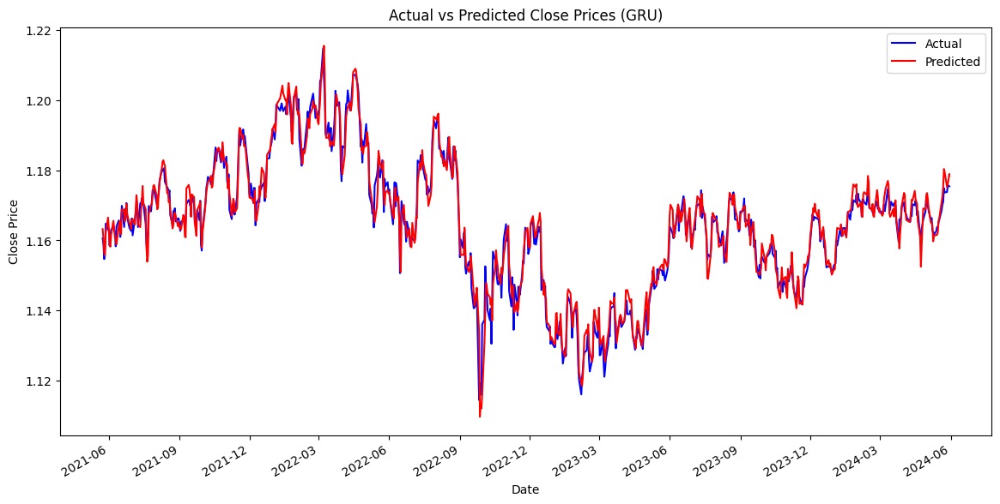

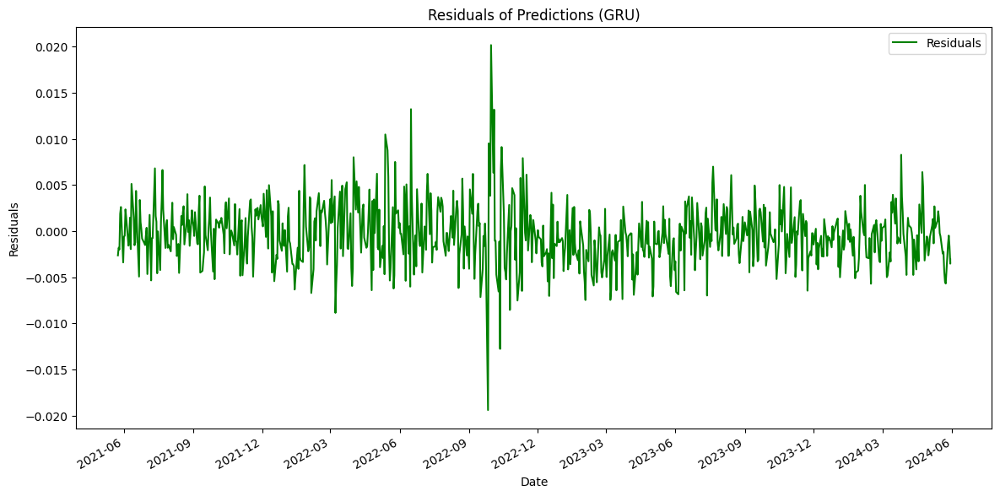

Shapes of the arrays - dates: (790,), y_test_actual: (790, 1), y_pred_actual: (790, 1)


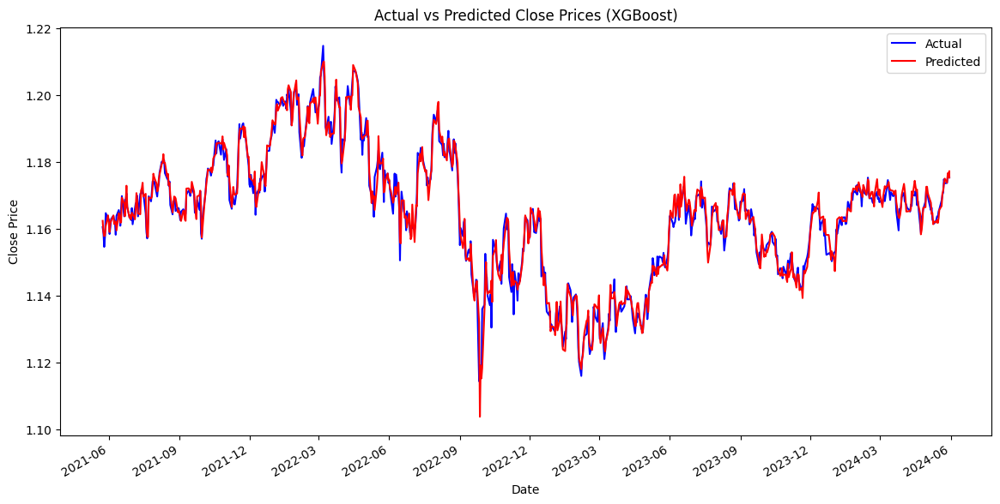

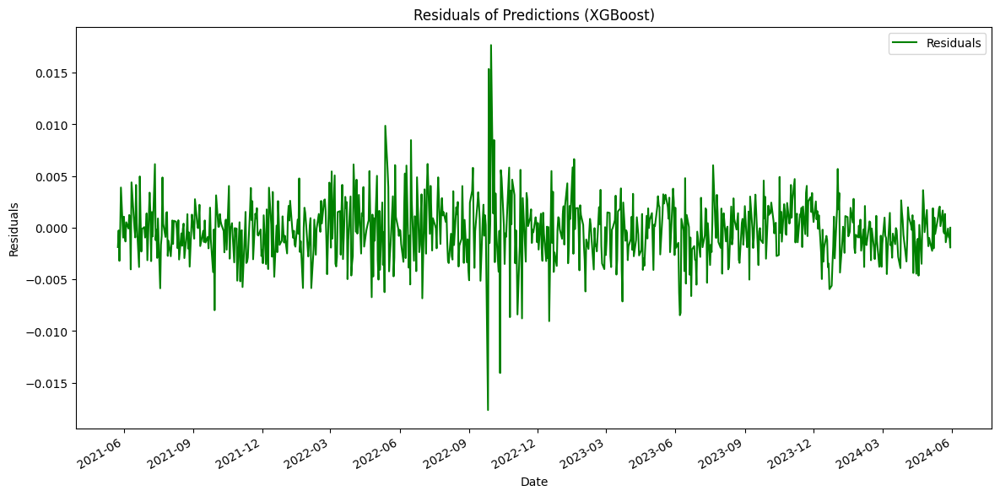

Shapes of the arrays - dates: (790,), y_test_actual: (790, 1), y_pred_actual: (790, 1), sigma_gpr_test: (790,)


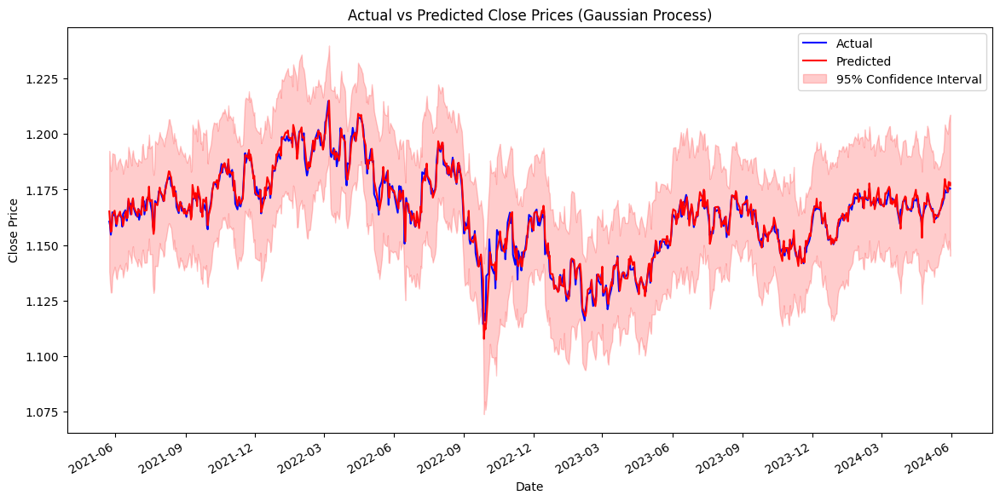

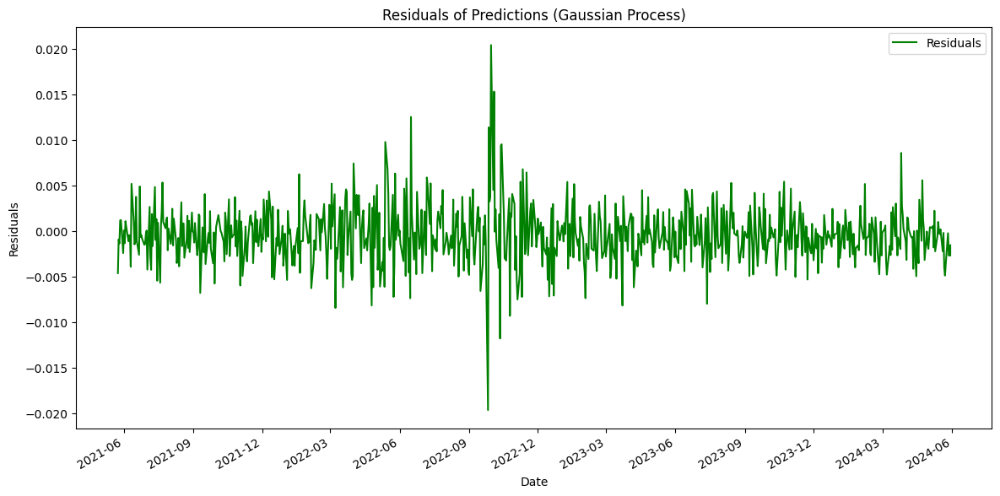

In [ ]:
def format_date_axis(ax):
    """
    Format the x-axis to display dates in a readable format.

    Parameters:
    ax (matplotlib.axes.Axes): The axes object to format.
    """
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    plt.gcf().autofmt_xdate()

def plot_predictions(dates, y_test_actual, y_pred_actual, model_name):
    """
    Plot actual vs predicted close prices.

    Parameters:
    dates (pd.Series): Dates for the x-axis.
    y_test_actual (np.ndarray): Actual values of the target variable.
    y_pred_actual (np.ndarray): Predicted values of the target variable.
    model_name (str): Name of the model used for predictions.
    """
    print(f"Shapes of the arrays - dates: {dates.shape}, y_test_actual: {y_test_actual.shape}, y_pred_actual: {y_pred_actual.shape}")
    plt.figure(figsize=(14, 7))
    plt.plot(dates, y_test_actual, label='Actual', color='blue')
    plt.plot(dates, y_pred_actual, label='Predicted', color='red')
    plt.title(f'Actual vs Predicted Close Prices ({model_name})')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.legend()
    format_date_axis(plt.gca())
    plt.show()

def plot_residuals(dates, y_test_actual, y_pred_actual, model_name):
    """
    Plot residuals of predictions.

    Parameters:
    dates (pd.Series): Dates for the x-axis.
    y_test_actual (np.ndarray): Actual values of the target variable.
    y_pred_actual (np.ndarray): Predicted values of the target variable.
    model_name (str): Name of the model used for predictions.
    """
    residuals = y_test_actual - y_pred_actual
    plt.figure(figsize=(14, 7))
    plt.plot(dates, residuals, label='Residuals', color='green')
    plt.title(f'Residuals of Predictions ({model_name})')
    plt.xlabel('Date')
    plt.ylabel('Residuals')
    plt.legend()
    format_date_axis(plt.gca())
    plt.show()

def plot_gpr_predictions(dates, y_test_actual, y_pred_actual, sigma_gpr_test):
    """
    Plot actual vs predicted close prices with 95% confidence interval for Gaussian Process.

    Parameters:
    dates (pd.Series): Dates for the x-axis.
    y_test_actual (np.ndarray): Actual values of the target variable.
    y_pred_actual (np.ndarray): Predicted values of the target variable.
    sigma_gpr_test (np.ndarray): Standard deviation of the predictions.
    """
    print(f"Shapes of the arrays - dates: {dates.shape}, y_test_actual: {y_test_actual.shape}, y_pred_actual: {y_pred_actual.shape}, sigma_gpr_test: {sigma_gpr_test.shape}")
    plt.figure(figsize=(14, 7))
    plt.plot(dates, y_test_actual, label='Actual', color='blue')
    plt.plot(dates, y_pred_actual, label='Predicted', color='red')
    plt.fill_between(dates, y_pred_actual.flatten() - 1.96 * sigma_gpr_test, y_pred_actual.flatten() + 1.96 * sigma_gpr_test, color='red', alpha=0.2, label='95% Confidence Interval')
    plt.title('Actual vs Predicted Close Prices (Gaussian Process)')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.legend()
    format_date_axis(plt.gca())
    plt.show()

def plot_validation_loss(history, model_name):
    plt.figure(figsize=(14, 7))
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Validation Loss Over Epochs ({model_name})')
    plt.xlabel('Epochs')
    plt.ylabel('Validation Loss')
    plt.legend()
    plt.show()

# GRU plots
plot_predictions(test_dates_seq, best_Y_test_gru_inverse, best_gru_test_predictions, "GRU")
plot_residuals(test_dates_seq, best_Y_test_gru_inverse, best_gru_test_predictions, "GRU")
#plot_validation_loss(best_history_gru, "GRU")

# XGBoost plots
plot_predictions(test_dates_seq, y_test_flat_inverse_xgb, xgb_test_predictions, "XGBoost")
plot_residuals(test_dates_seq, y_test_flat_inverse_xgb, xgb_test_predictions, "XGBoost")

# GPR plots
plot_gpr_predictions(test_dates_seq, y_test_seq_inverse_gpr, gpr_test_predictions, sigma_gpr_test)
plot_residuals(test_dates_seq, y_test_seq_inverse_gpr, gpr_test_predictions, "Gaussian Process")


# **Building Trading Strategy**

In [ ]:
# General function to generate signals
def generate_trading_signals(y_actual, y_predicted, date):
    signals = []
    for i in range(len(y_actual) - 1):
        if y_pred[i] > y_actual[i]:
            signals.append((date[i], y_actual[i][0], y_predicted[i][0], 'Buy'))
        elif y_pred[i] < y_actual[i]:
            signals.append((date[i], y_actual[i][0], y_predicted[i][0], 'Sell'))
        else:
            signals.append((date[i], y_actual[i][0], y_predicted[i][0], 'Hold'))
    return signals


# Generate signals for the test data
signals_gru = generate_trading_signals(best_Y_test_gru_inverse, best_gru_test_predictions, test_dates_seq[:-1])
signals_xgb = generate_trading_signals(y_test_flat_inverse_xgb, xgb_test_predictions, test_dates_seq[:-1])
signals_gpr = generate_trading_signals(y_test_seq_inverse_gpr, gpr_test_predictions, test_dates_seq[:-1])

# Combine dates, true values, predicted values, and signals into structured arrays for easy analysis
dtype = [('Date', 'U10'), ('Actual Prices', 'f4'), ('Predicted Prices', 'f4'), ('Trading Signal', 'U4')]
results_gru = np.array(signals_gru, dtype=dtype)
results_xgb = np.array(signals_xgb, dtype=dtype)
results_gpr = np.array(signals_gpr, dtype=dtype)

# Print the results
print("GRU Model Results:")
print(f"{'Date':<15} {'Actual Prices':<10} {'Predicted Prices':<10} {'Trading Signal':<5}")
for row in results_gru:
    print(f"{row['Date']:<15} {row['Actual Prices']:<15.4f} {row['Predicted Prices']:<15.4f} {row['Trading Signal']}")

print("\nXGBoost Model Results:")
print(f"{'Date':<15} {'Actual Prices':<10} {'Predicted Prices':<10} {'Trading Signal ':<5}")
for row in results_xgb:
    print(f"{row['Date']:<15} {row['Actual Prices']:<15.4f} {row['Predicted Prices']:<15.4f} {row['Trading Signal']}")

print("\nGaussian Process Regressor Model Results:")
print(f"{'Date':<15} {'Actual Prices':<10} {'Predicted Prices':<10} {'Trading Signal':<5}")
for row in results_gpr:
    print(f"{row['Date']:<15} {row['Actual Prices']:<15.4f} {row['Predicted Prices']:<15.4f} {row['Trading Signal']}")

GRU Model Results:
Date            Actual Prices Predicted Prices Trading Signal
2021-05-24      1.1606          1.1632          Sell
2021-05-25      1.1588          1.1606          Sell
2021-05-26      1.1547          1.1567          Sell
2021-05-27      1.1576          1.1558          Sell
2021-05-28      1.1648          1.1622          Sell
2021-05-31      1.1631          1.1665          Sell
2021-06-01      1.1630          1.1635          Sell
2021-06-02      1.1585          1.1590          Sell
2021-06-03      1.1606          1.1582          Sell
2021-06-04      1.1630          1.1616          Sell
2021-06-07      1.1640          1.1656          Sell
2021-06-08      1.1627          1.1634          Sell
2021-06-09      1.1623          1.1608          Sell
2021-06-10      1.1583          1.1602          Sell
2021-06-11      1.1640          1.1588          Sell
2021-06-14      1.1657          1.1642          Sell
2021-06-15      1.1639          1.1654          Sell
2021-06-16      1.

Predicting close prices for the next day

In [ ]:
# Get the last sequence from the test set
last_sequence = scaled_X_test[-sequence_length:]

# Reshape to fit the model input shape (1, sequence_length, n_features)
last_sequence = np.expand_dims(last_sequence, axis=0)
last_sequence_2d = last_sequence.reshape(1, -1)

# Convert NumPy array to DMatrix for XGBoost
last_sequence_dmatrix = xgb.DMatrix(last_sequence.reshape(1, -1)) # Reshape to 2D array

# Predict the next day's value
next_day_prediction_gru = model_gru.predict(last_sequence)
next_day_prediction_xgb = model_xgb.predict(last_sequence_dmatrix)
next_day_prediction_gpr = model_gpr.predict(last_sequence_2d)


# Inverse transform to get the actual predicted value
next_day_prediction_gru = scaler_Y.inverse_transform(next_day_prediction_gru)
next_day_prediction_xgb = scaler_Y.inverse_transform(next_day_prediction_xgb.reshape(-1, 1))
next_day_prediction_gpr = scaler_Y.inverse_transform(next_day_prediction_gpr.reshape(-1, 1))

# Calculate the next date
next_day_date = np.datetime64(test_dates_seq[-1]) + np.timedelta64(1, 'D')

# Print the predicted value for the next day
print(f"GRU Predicted value for {next_day_date}: {next_day_prediction_gru[0][0]:.4f}")
print(f"Xgboost Predicted value for {next_day_date}: {next_day_prediction_xgb[0][0]:.4f}")
print(f" GPR Predicted value for {next_day_date}: {next_day_prediction_gpr[0][0]:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step
GRU Predicted value for 2024-05-31T00:00:00.000000000: 1.1785
Xgboost Predicted value for 2024-05-31T00:00:00.000000000: 1.1754
 GPR Predicted value for 2024-05-31T00:00:00.000000000: 1.1770


In [ ]:
print("GRU Predictions:", best_gru_test_predictions[:10])
print("XGBoost Predictions:", xgb_test_predictions[:10])
print("GPR Predictions:", gpr_test_predictions[:10])


GRU Predictions: [[1.1632313]
 [1.1606314]
 [1.1566612]
 [1.1557525]
 [1.162173 ]
 [1.1665324]
 [1.1635463]
 [1.1590358]
 [1.1581988]
 [1.1615715]]
XGBoost Predictions: [[1.1624742]
 [1.1590921]
 [1.1578785]
 [1.1581303]
 [1.1608971]
 [1.164098 ]
 [1.1618924]
 [1.1591336]
 [1.1618909]
 [1.1624695]]
GPR Predictions: [[1.16518399]
 [1.15971088]
 [1.15600313]
 [1.1564206 ]
 [1.16355169]
 [1.16552224]
 [1.16285051]
 [1.1598259 ]
 [1.1594363 ]
 [1.16247239]]



GRU Model Results:
Final Balance: 1.36925, Profit: -9998.63075, Sharpe Ratio: -0.31731, Max Drawdown: 0.99986

XGBoost Model Results:
Final Balance: 1.36925, Profit: -9998.63075, Sharpe Ratio: -0.31731, Max Drawdown: 0.99986

Gaussian Process Regressor Model Results:
Final Balance: 1.36925, Profit: -9998.63075, Sharpe Ratio: -0.31731, Max Drawdown: 0.99986


ValueError: x and y must have same first dimension, but have shapes (788,) and (789,)

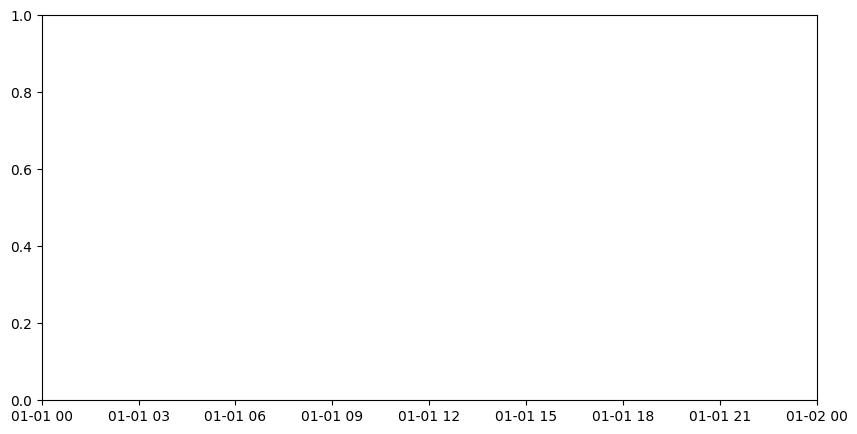

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Adaptive Stop-Loss based on volatility
def adaptive_stop_loss(price, volatility, factor=2):
    return price * (1 - factor * volatility)

# Adaptive Take-Profit based on volatility
def adaptive_take_profit(price, volatility, factor=2):
    return price * (1 + factor * volatility)

# Trailing Stop-Loss
def trailing_stop_loss(entry_price, current_price, stop_loss, trail_factor=0.99):
    if current_price > entry_price:
        stop_loss = max(stop_loss, current_price * trail_factor)
    return stop_loss

# Dynamic Position Sizing with a cap on position size
def calculate_position_size(balance, risk_percentage, stop_loss_distance, max_position_size=0.1):
    position_size = balance * risk_percentage / stop_loss_distance
    return min(position_size, balance * max_position_size)  # Cap the position size

# Function to calculate daily returns
def calculate_daily_returns(balance_history):
    balance_history = np.array(balance_history)
    returns = (balance_history[1:] - balance_history[:-1]) / balance_history[:-1]
    return returns

# Function to calculate Sharpe ratio
def calculate_sharpe_ratio(returns, risk_free_rate=0.01):
    if len(returns) == 0:
        return np.nan
    excess_returns = returns - (risk_free_rate / 252)
    if np.std(excess_returns) == 0:
        return np.nan
    return np.mean(excess_returns) / np.std(excess_returns)

# Function to calculate maximum drawdown
def calculate_max_drawdown(balance_history):
    balance_history = np.array(balance_history)
    peak = np.maximum.accumulate(balance_history)
    drawdown = (peak - balance_history) / peak
    return np.max(drawdown)

# Simulate and evaluate the advanced trading strategy
def simulate_and_evaluate_advanced_trading(signals, actual_prices, dates, initial_balance=10000, risk_percentage=0.03):
    balance = initial_balance
    position_size = 0
    balance_history = []
    stop_loss = None
    take_profit = None

    for i, (date, actual_price, predicted_price, signal) in enumerate(signals):
        price = actual_prices[i]
        volatility = np.std(actual_prices[max(0, i-14):i+1])  # 14-day rolling volatility

        if signal == 'Buy' and balance > 0:
            stop_loss = adaptive_stop_loss(price, volatility)
            take_profit = adaptive_take_profit(price, volatility)
            stop_loss_distance = price - stop_loss
            position_size = calculate_position_size(balance, risk_percentage, stop_loss_distance)
            balance -= position_size * price

        elif signal == 'Sell' and position_size > 0:
            balance += position_size * price
            position_size = 0

        balance_history.append(balance + position_size * actual_prices[i])

    final_balance = balance + (position_size * actual_prices[-1])
    daily_returns = calculate_daily_returns(balance_history)
    sharpe_ratio = calculate_sharpe_ratio(daily_returns)
    max_drawdown = calculate_max_drawdown(balance_history)

    return final_balance, final_balance - initial_balance, sharpe_ratio, max_drawdown, balance_history, dates[:-1]

# Plotting function to visualize trading performance
def plot_trading_performance(trade_dates, balance_history, model_name):
    plt.figure(figsize=(10, 5))
    plt.plot(trade_dates, balance_history, label=f'{model_name} Balance Over Time')
    plt.xlabel('Date')
    plt.ylabel('Account Balance')
    plt.title(f'{model_name} Trading Performance')
    plt.legend()
    plt.show()

# Sample function calls (assuming the signals and data are prepared correctly)

# Generate signals for the test data using the updated signal generation
signals_gru = generate_Trading_signals(best_Y_test_gru_inverse, best_gru_test_predictions, test_dates_seq[:-1])
signals_xgb = generate_Trading_signals(y_test_flat_inverse_xgb, xgb_test_predictions, test_dates_seq[:-1])
signals_gpr = generate_Trading_signals(y_test_seq_inverse_gpr, gpr_test_predictions, test_dates_seq[:-1])

# Evaluate the GRU model
final_balance_gru, profit_gru, sharpe_ratio_gru, max_drawdown_gru, balance_history_gru, trade_dates_gru = simulate_and_evaluate_advanced_trading(
    signals_gru, best_Y_test_gru_inverse.flatten(), test_dates_seq[:-1])

# Evaluate the XGBoost model
final_balance_xgb, profit_xgb, sharpe_ratio_xgb, max_drawdown_xgb, balance_history_xgb, trade_dates_xgb = simulate_and_evaluate_advanced_trading(
    signals_xgb, y_test_flat_inverse_xgb.flatten(), test_dates_seq[:-1])

# Evaluate the GPR model
final_balance_gpr, profit_gpr, sharpe_ratio_gpr, max_drawdown_gpr, balance_history_gpr, trade_dates_gpr = simulate_and_evaluate_advanced_trading(
    signals_gpr, y_test_seq_inverse_gpr.flatten(), test_dates_seq[:-1])

# Print the results for each model
print("\nGRU Model Results:")
print(f"Final Balance: {final_balance_gru:.5f}, Profit: {profit_gru:.5f}, Sharpe Ratio: {sharpe_ratio_gru:.5f}, Max Drawdown: {max_drawdown_gru:.5f}")

print("\nXGBoost Model Results:")
print(f"Final Balance: {final_balance_xgb:.5f}, Profit: {profit_xgb:.5f}, Sharpe Ratio: {sharpe_ratio_xgb:.5f}, Max Drawdown: {max_drawdown_xgb:.5f}")

print("\nGaussian Process Regressor Model Results:")
print(f"Final Balance: {final_balance_gpr:.5f}, Profit: {profit_gpr:.5f}, Sharpe Ratio: {sharpe_ratio_gpr:.5f}, Max Drawdown: {max_drawdown_gpr:.5f}")

# Optionally plot the performance
plot_trading_performance(trade_dates_gru, balance_history_gru, "GRU Model")
plot_trading_performance(trade_dates_xgb, balance_history_xgb, "XGBoost Model")
plot_trading_performance(trade_dates_gpr, balance_history_gpr, "GPR Model")


In [ ]:
# Example: Adaptive Stop-Loss based on volatility
def adaptive_stop_loss(price, volatility):
    return price * (1 - 2 * volatility)

# Example: Trailing Stop-Loss
def trailing_stop_loss(entry_price, current_price, stop_loss):
    if current_price > entry_price:
        stop_loss = max(stop_loss, current_price * 0.99)
    return stop_loss

# Example: Dynamic Position Sizing
def calculate_position_size(balance, risk_percentage, stop_loss_distance):
    return balance * risk_percentage / stop_loss_distance



In [ ]:
def adaptive_take_profit(price, volatility):
    return price * (1 + 2 * volatility)

def simulate_and_evaluate_advanced_trading(signals, actual_prices, dates, initial_balance=10000, risk_percentage=0.02):
    balance = initial_balance
    position_size = 0
    balance_history = []
    stop_loss = None
    take_profit = None

    for i, (date, actual_price, predicted_price, signal) in enumerate(signals):
        price = actual_prices[i]
        volatility = np.std(actual_prices[max(0, i-14):i+1])  # 14-day rolling volatility

        if signal == 'Buy':
            stop_loss = adaptive_stop_loss(price, volatility)
            take_profit = adaptive_take_profit(price, volatility)
            stop_loss_distance = (price - stop_loss)
            position_size = calculate_position_size(balance, risk_percentage, stop_loss_distance)
            balance -= position_size * price

        elif signal == 'Sell' and position_size > 0:
            balance += position_size * price
            position_size = 0

        balance_history.append(balance)

    final_balance = balance + (position_size * actual_prices[-1])
    daily_returns = calculate_daily_returns(balance_history)
    sharpe_ratio = calculate_sharpe_ratio(daily_returns)
    max_drawdown = calculate_max_drawdown(balance_history)

    return final_balance, final_balance - initial_balance, sharpe_ratio, max_drawdown, balance_history



GRU Predictions: [[1.1632313]
 [1.1606314]
 [1.1566612]
 [1.1557525]
 [1.162173 ]
 [1.1665324]
 [1.1635463]
 [1.1590358]
 [1.1581988]
 [1.1615715]]
XGBoost Predictions: [[1.1624742]
 [1.1590921]
 [1.1578785]
 [1.1581303]
 [1.1608971]
 [1.164098 ]
 [1.1618924]
 [1.1591336]
 [1.1618909]
 [1.1624695]]
GPR Predictions: [[1.16518399]
 [1.15971088]
 [1.15600313]
 [1.1564206 ]
 [1.16355169]
 [1.16552224]
 [1.16285051]
 [1.1598259 ]
 [1.1594363 ]
 [1.16247239]]
GRU Signals: [(numpy.datetime64('2021-05-24T00:00:00.000000000'), 1.1606, 1.1632313, 'Sell'), (numpy.datetime64('2021-05-25T00:00:00.000000000'), 1.15883, 1.1606314, 'Sell'), (numpy.datetime64('2021-05-26T00:00:00.000000000'), 1.15467, 1.1566612, 'Sell'), (numpy.datetime64('2021-05-27T00:00:00.000000000'), 1.15764, 1.1557525, 'Sell'), (numpy.datetime64('2021-05-28T00:00:00.000000000'), 1.16479, 1.162173, 'Sell'), (numpy.datetime64('2021-05-31T00:00:00.000000000'), 1.16314, 1.1665324, 'Sell'), (numpy.datetime64('2021-06-01T00:00:00.00000

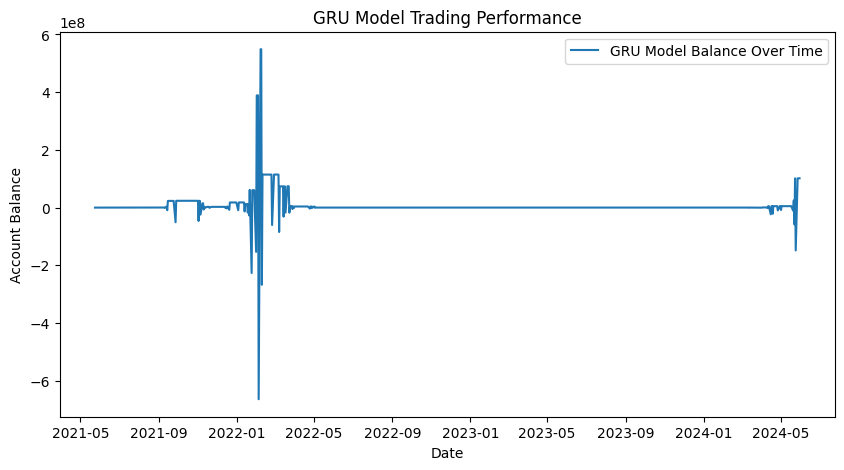

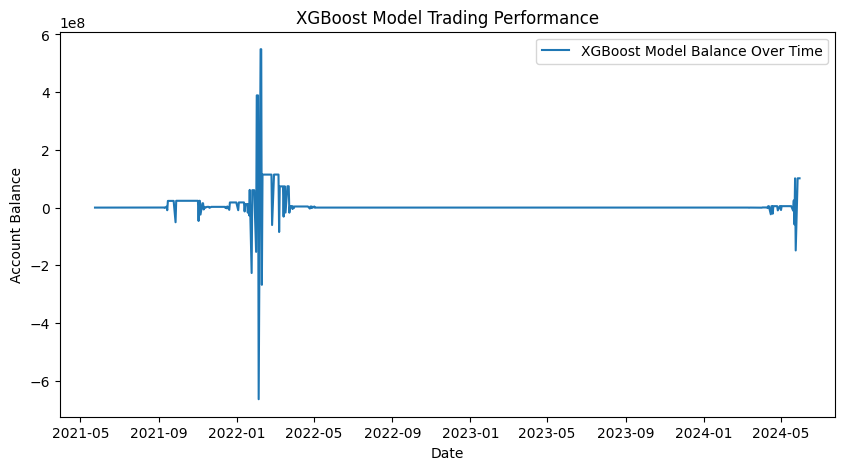

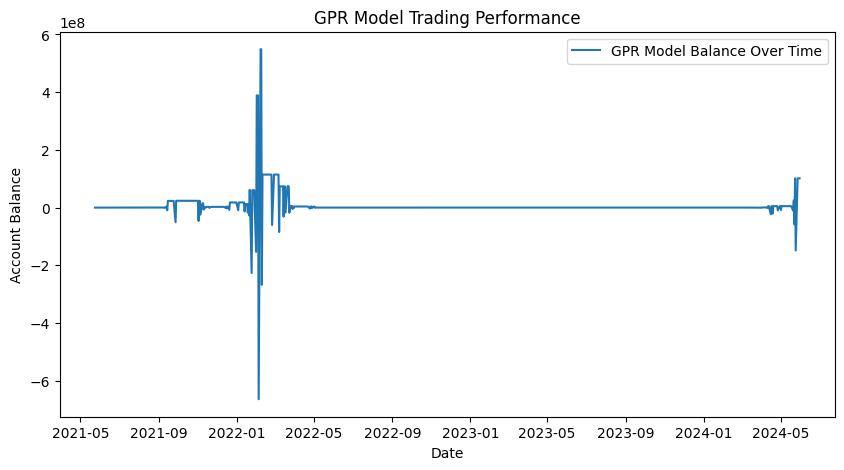

In [ ]:


# Function to calculate daily returns
def calculate_daily_returns(balance_history):
    balance_history = np.array(balance_history)
    returns = (balance_history[1:] - balance_history[:-1]) / balance_history[:-1]
    return returns

# Function to calculate Sharpe ratio
def calculate_sharpe_ratio(returns, risk_free_rate=0.01):
    if len(returns) == 0:
        return np.nan
    excess_returns = returns - (risk_free_rate / 252)
    if np.std(excess_returns) == 0:
        return np.nan
    return np.mean(excess_returns) / np.std(excess_returns)

# Function to calculate maximum drawdown
def calculate_max_drawdown(balance_history):
    balance_history = np.array(balance_history)
    peak = np.maximum.accumulate(balance_history)
    drawdown = (peak - balance_history) / peak
    return np.max(drawdown)

print("GRU Predictions:", best_gru_test_predictions[:10])
print("XGBoost Predictions:", xgb_test_predictions[:10])
print("GPR Predictions:", gpr_test_predictions[:10])

# Generate signals for the test data using the updated signal generation
signals_gru = generate_Trading_signals(best_Y_test_gru_inverse, best_gru_test_predictions, test_dates_seq[:-1])
signals_xgb = generate_Trading_signals(y_test_flat_inverse_xgb, xgb_test_predictions, test_dates_seq[:-1])
signals_gpr = generate_Trading_signals(y_test_seq_inverse_gpr, gpr_test_predictions, test_dates_seq[:-1])

print("GRU Signals:", signals_gru[:10])
print("XGBoost Signals:", signals_xgb[:10])
print("GPR Signals:", signals_gpr[:10])


# Evaluate the GRU model


final_balance_gru, profit_gru, sharpe_ratio_gru, max_drawdown_gru, balance_history_gru = simulate_and_evaluate_advanced_trading(
    signals_gru, best_Y_test_gru_inverse.flatten(), test_dates_seq[:-1])


# Evaluate the XGBoost model
final_balance_xgb, profit_xgb, sharpe_ratio_xgb, max_drawdown_xgb, balance_history_xgb = simulate_and_evaluate_advanced_trading(
    signals_xgb, y_test_flat_inverse_xgb.flatten(), test_dates_seq[:-1])

# Evaluate the GPR model
final_balance_gpr, profit_gpr, sharpe_ratio_gpr, max_drawdown_gpr, balance_history_gpr = simulate_and_evaluate_advanced_trading(
    signals_gpr, y_test_seq_inverse_gpr.flatten(), test_dates_seq[:-1])

# Print the results for each model
print("\nGRU Model Results:")
print(f"Final Balance: {final_balance_gru:.5f}, Profit: {profit_gru:.5f}, Sharpe Ratio: {sharpe_ratio_gru:.5f}, Max Drawdown: {max_drawdown_gru:.5f}")

print("\nXGBoost Model Results:")
print(f"Final Balance: {final_balance_xgb:.5f}, Profit: {profit_xgb:.5f}, Sharpe Ratio: {sharpe_ratio_xgb:.5f}, Max Drawdown: {max_drawdown_xgb:.5f}")

print("\nGaussian Process Regressor Model Results:")
print(f"Final Balance: {final_balance_gpr:.5f}, Profit: {profit_gpr:.5f}, Sharpe Ratio: {sharpe_ratio_gpr:.5f}, Max Drawdown: {max_drawdown_gpr:.5f}")

# Plotting function (if needed)
def plot_trading_performance(trade_dates, balance_history, model_name):
    import matplotlib.pyplot as plt

    plt.figure(figsize=(10, 5))
    plt.plot(trade_dates, balance_history, label=f'{model_name} Balance Over Time')
    plt.xlabel('Date')
    plt.ylabel('Account Balance')
    plt.title(f'{model_name} Trading Performance')
    plt.legend()
    plt.show()

# Optionally plot the performance
plot_trading_performance(trade_dates_gru, balance_history_gru, "GRU Model")
plot_trading_performance(trade_dates_xgb, balance_history_xgb, "XGBoost Model")
plot_trading_performance(trade_dates_gpr, balance_history_gpr, "GPR Model")


In [ ]:
# Function to simulate and evaluate trading strategy
def simulate_and_evaluate_trading(signals, actual, dates, initial_balance=10000, stop_loss_pct=0.001, take_profit_pct=0.002):
    balance = initial_balance
    position_size = 0
    balance_history = []
    trade_dates = []

    for i, (date, actual_price, predicted_price, signal) in enumerate(signals):
        trade_amount = actual_price  # Price per unit

        if signal == 'Buy' and balance > trade_amount:
            position_size = int(balance // trade_amount)
            cost = position_size * trade_amount
            balance -= cost
            entry_price = trade_amount
            stop_loss_price = entry_price * (1 - stop_loss_pct)
            take_profit_price = entry_price * (1 + take_profit_pct)

            for j in range(i + 1, len(actual)):
                if actual[j] <= stop_loss_price or actual[j] >= take_profit_price:
                    balance += position_size * actual[j]
                    position_size = 0
                    break

        elif signal == 'Sell' and position_size > 0:
            balance += position_size * trade_amount
            position_size = 0

        # Update balance with the current position value
        balance_history.append(max(balance + position_size * actual[i], 0))
        trade_dates.append(date)

    final_balance = balance_history[-1] if balance_history else initial_balance
    profit = final_balance - initial_balance
    daily_returns = calculate_daily_returns(balance_history)
    sharpe_ratio = calculate_sharpe_ratio(daily_returns)
    max_drawdown = calculate_max_drawdown(balance_history)

    return final_balance, profit, sharpe_ratio, max_drawdown, balance_history, trade_dates

In [ ]:
# Get the last sequence from the test set
last_sequence = scaled_X_test[-sequence_length:]

# Reshape to fit the model input shape (1, sequence_length, n_features)
last_sequence = np.expand_dims(last_sequence, axis=0)
last_sequence_2d = last_sequence.reshape(1, -1)  # Reshape for models requiring 2D input

# Dictionary to hold the models and their corresponding inputs
models = {
    "GRU": (model_gru, last_sequence),
    "XGBoost": (model_xgb, xgb.DMatrix(last_sequence_2d)),
    "GPR": (model_gpr, last_sequence_2d)
}

# Dictionary to store predictions
predictions = {}

# Predict the next day's value for each model
for name, (model, input_data) in models.items():
    if name == "XGBoost":
        predictions[name] = model.predict(input_data)
    else:
        predictions[name] = model.predict(input_data)

    # Reshape if necessary and inverse transform the predictions
    predictions[name] = scaler_Y.inverse_transform(predictions[name].reshape(-1, 1))

# Calculate the next date
next_day_date = np.datetime64(test_dates_seq[-1]) + np.timedelta64(1, 'D')

# Print the predicted values for the next day
for name, prediction in predictions.items():
    print(f"{name} Predicted value for {next_day_date}: {prediction[0][0]:.4f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
GRU Predicted value for 2024-05-31T00:00:00.000000000: 1.1785
XGBoost Predicted value for 2024-05-31T00:00:00.000000000: 1.1754
GPR Predicted value for 2024-05-31T00:00:00.000000000: 1.1770


In [ ]:
# Initialize lists to store predictions
predictions_gru = []
predictions_xgb = []
predictions_gpr = []

# Start with the last sequence in the test set
current_sequence = last_sequence.copy()  # Use the already defined last_sequence

for _ in range(10):  # Predict for the next 10 days
    # Predict the next day's value using each model
    next_day_prediction_gru = model_gru.predict(current_sequence)
    next_day_prediction_xgb = model_xgb.predict(last_sequence_dmatrix)
    next_day_prediction_gpr = model_gpr.predict(last_sequence_2d)

    # Inverse transform the predictions
    next_day_prediction_gru = scaler_Y.inverse_transform(next_day_prediction_gru)[0, 0]
    next_day_prediction_xgb = scaler_Y.inverse_transform(next_day_prediction_xgb.reshape(-1, 1))[0, 0]
    next_day_prediction_gpr = scaler_Y.inverse_transform(next_day_prediction_gpr.reshape(-1, 1))[0, 0]

    # Store predictions
    predictions_gru.append(next_day_prediction_gru)
    predictions_xgb.append(next_day_prediction_xgb)
    predictions_gpr.append(next_day_prediction_gpr)

    # Update the sequence by removing the oldest value and adding the predicted value
    current_sequence = np.roll(current_sequence, -1, axis=1)  # Shift the sequence
    current_sequence[0, -1, -1] = next_day_prediction_gru  # Update with GRU's prediction

    # Update the 2D sequence and DMatrix for XGBoost
    last_sequence_2d = current_sequence.reshape(1, -1)
    last_sequence_dmatrix = xgb.DMatrix(last_sequence_2d)

# Calculate the dates for the next 10 days
next_dates = [np.datetime64(test_dates_seq[-1]) + np.timedelta64(i + 1, 'D') for i in range(10)]

# Print the predicted values for the next 10 days
for i in range(10):
    print(f"Date: {next_dates[i]}")
    print(f"  GRU Predicted value: {predictions_gru[i]:.4f}")
    print(f"  XGBoost Predicted value: {predictions_xgb[i]:.4f}")
    print(f"  GPR Predicted value: {predictions_gpr[i]:.4f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Date: 2024-05-31T00:00:00.000000000
  GRU Predicted value: 1.1785
  XGBoost Predicted value: 1.1754
  GPR Predicted value: 1.1770
Date: 2024-06-01T00:00:00.000000000
  GRU Predicted value: 1.1452
  XGBoost Predicted value: 1.1588
  GPR Predicted value: 1.1359
Date: 2024-06-02T00:00:00.000000000
  GRU Predicted value: 1.1484
  XGBoost Predicted value: 1.1627
  GPR Predicted value: 1.1578
Date: 2024-06-03T00:00:00.000000000
  GRU Predicted value: 1.1565
  XGBoost Predicted value: 1.1621
  GPR Predicted value: 1.1615
Date: 2024-06-04T00:00:00.000000000
  GRU Predicted value: 1.1630
  XGBoost Predicted value: 1.1622


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Date: 2024-05-31T00:00:00.000000000
  GRU Predicted value: 1.1785
  XGBoost Predicted value: 1.1754
  GPR Predicted value: 1.1770
Date: 2024-06-01T00:00:00.000000000
  GRU Predicted value: 1.1452
  XGBoost Predicted value: 1.1588
  GPR Predicted value: 1.1359
Date: 2024-06-02T00:00:00.000000000
  GRU Predicted value: 1.1484
  XGBoost Predicted value: 1.1627
  GPR Predicted value: 1.1578
Date: 2024-06-03T00:00:00.000000000
  GRU Predicted value: 1.1565
  XGBoost Predicted value: 1.1621
  GPR Predicted value: 1.1615
Date: 2024-06-04T00:00:00.000000000
  GRU Predicted value: 1.1630
  XGBoost Predicted value: 1.1622


In [ ]:
# General function to generate signals with stop-loss and take-profit
def generate_trading_signals_with_risk_management(y_actual, y_predicted, date, stop_loss_pct=0.001, take_profit_pct=0.002):
    signals = []
    buy_price = None

    for i in range(len(y_actual) - 1):
        current_price = y_actual[i][0]
        predicted_price = y_predicted[i][0]
        current_date = date[i]

        print(f"Processing Date: {current_date}, Actual: {current_price}, Predicted: {predicted_price}")  # Debugging print

        if buy_price is None:
            # Generate buy/sell/hold signal based on prediction
            if predicted_price > current_price:
                signals.append((current_date, current_price, predicted_price, 'Buy'))
                buy_price = current_price  # Update buy price after a Buy signal
                print(f"Buy signal generated on {current_date} at price {current_price}")  # Debugging print
            elif predicted_price < current_price:
                signals.append((current_date, current_price, predicted_price, 'Sell'))
                print(f"Sell signal generated on {current_date} at price {current_price}")  # Debugging print
            else:
                signals.append((current_date, current_price, predicted_price, 'Hold'))
                print(f"Hold signal generated on {current_date} at price {current_price}")  # Debugging print
        else:
            # Calculate stop-loss and take-profit levels
            stop_loss_level = buy_price * (1 - stop_loss_pct)
            take_profit_level = buy_price * (1 + take_profit_pct)

            print(f"Stop-Loss Level: {stop_loss_level}, Take-Profit Level: {take_profit_level}")  # Debugging print

            if current_price <= stop_loss_level:
                signals.append((current_date, current_price, predicted_price, 'Sell (Stop-Loss)'))
                buy_price = None  # Reset the buy price after a stop-loss sell
                print(f"Stop-Loss triggered on {current_date} at price {current_price}")  # Debugging print
            elif current_price >= take_profit_level:
                signals.append((current_date, current_price, predicted_price, 'Sell (Take-Profit)'))
                buy_price = None  # Reset the buy price after a take-profit sell
                print(f"Take-Profit triggered on {current_date} at price {current_price}")  # Debugging print
            else:
                signals.append((current_date, current_price, predicted_price, 'Hold'))

    print("Generated signals:", signals)  # Debugging print
    return signals

# Generate signals for the test data with risk management
signals_gru = generate_trading_signals_with_risk_management(best_Y_test_gru_inverse, best_gru_test_predictions, test_dates_seq[:-1])
signals_xgb = generate_trading_signals_with_risk_management(y_test_flat_inverse_xgb, xgb_test_predictions, test_dates_seq[:-1])
signals_gpr = generate_trading_signals_with_risk_management(y_test_seq_inverse_gpr, gpr_test_predictions, test_dates_seq[:-1])

# Combine dates, true values, predicted values, and signals into structured arrays for easy analysis
dtype = [('Date', 'U10'), ('Actual Prices', 'f4'), ('Predicted Prices', 'f4'), ('Trading Signal', 'U20')]
results_gru = np.array(signals_gru, dtype=dtype)
results_xgb = np.array(signals_xgb, dtype=dtype)
results_gpr = np.array(signals_gpr, dtype=dtype)

# Print the results
print("GRU Model Results:")
print(f"{'Date':<15} {'Actual Prices':<10} {'Predicted Prices':<10} {'Trading Signal':<5}")
for row in results_gru:
    print(f"{row['Date']:<15} {row['Actual Prices']:<15.4f} {row['Predicted Prices']:<15.4f} {row['Trading Signal']}")

print("\nXGBoost Model Results:")
print(f"{'Date':<15} {'Actual Prices':<10} {'Predicted Prices':<10} {'Trading Signal':<5}")
for row in results_xgb:
    print(f"{row['Date']:<15} {row['Actual Prices']:<15.4f} {row['Predicted Prices']:<15.4f} {row['Trading Signal']}")

print("\nGaussian Process Regressor Model Results:")
print(f"{'Date':<15} {'Actual Prices':<10} {'Predicted Prices':<10} {'Trading Signal':<5}")
for row in results_gpr:
    print(f"{row['Date']:<15} {row['Actual Prices']:<15.4f} {row['Predicted Prices']:<15.4f} {row['Trading Signal']}")



Streaming output truncated to the last 5000 lines.
Sell signal generated on 2023-01-13T00:00:00.000000000 at price 1.12483
Processing Date: 2023-01-16T00:00:00.000000000, Actual: 1.12933, Predicted: 1.1234889030456543
Sell signal generated on 2023-01-16T00:00:00.000000000 at price 1.12933
Processing Date: 2023-01-17T00:00:00.000000000, Actual: 1.12705, Predicted: 1.1295713186264038
Buy signal generated on 2023-01-17T00:00:00.000000000 at price 1.12705
Processing Date: 2023-01-18T00:00:00.000000000, Actual: 1.13835, Predicted: 1.1317088603973389
Stop-Loss Level: 1.12592295, Take-Profit Level: 1.1293041000000001
Take-Profit triggered on 2023-01-18T00:00:00.000000000 at price 1.13835
Processing Date: 2023-01-19T00:00:00.000000000, Actual: 1.14338, Predicted: 1.1435225009918213
Buy signal generated on 2023-01-19T00:00:00.000000000 at price 1.14338
Processing Date: 2023-01-20T00:00:00.000000000, Actual: 1.14378, Predicted: 1.1418943405151367
Stop-Loss Level: 1.14223662, Take-Profit Level: 1

In [ ]:
# Calculate daily returns
def calculate_daily_returns(balance_history):
    """
    Calculate daily returns based on balance history.

    Parameters:
    balance_history (array-like): History of account balances.

    Returns:
    array: Daily returns.
    """
    balance_history = np.array(balance_history)
    returns = (balance_history[1:] - balance_history[:-1]) / balance_history[:-1]
    return returns

In [ ]:
# Function to calculate Sharpe ratio
def calculate_sharpe_ratio(returns, risk_free_rate=0.01):
    """
    Calculate the Sharpe ratio of the returns.

    Parameters:
    returns (array-like): Daily returns.
    risk_free_rate (float): Risk-free rate for calculating excess returns.

    Returns:
    float: Sharpe ratio.
    """
    if len(returns) == 0:
        return np.nan
    excess_returns = returns - (risk_free_rate / 252)
    if np.std(excess_returns) == 0:
        return np.nan
    return np.mean(excess_returns) / np.std(excess_returns)

In [ ]:
# Function to calculate maximum drawdown
def calculate_max_drawdown(balance_history):
    """
    Calculate the maximum drawdown from the balance history.

    Parameters:
    balance_history (array-like): History of account balances.

    Returns:
    float: Maximum drawdown.
    """
    balance_history = np.array(balance_history)
    peak = np.maximum.accumulate(balance_history)
    drawdown = (peak - balance_history) / peak
    return np.max(drawdown)

In [ ]:
import numpy as np
import pandas as pd

# General function to generate signals with stop-loss and take-profit
def generate_trading_signals_with_risk_management(y_actual, y_predicted, date, stop_loss_pct=0.001, take_profit_pct=0.002):
    signals = []
    buy_price = None
    daily_returns = []

    for i in range(len(y_actual) - 1):
        current_price = y_actual[i][0]
        predicted_price = y_predicted[i][0]
        current_date = date[i]

        print(f"Processing Date: {current_date}, Actual: {current_price}, Predicted: {predicted_price}")  # Debugging print

        if buy_price is None:
            # Generate buy/sell/hold signal based on prediction
            if predicted_price > current_price:
                signals.append((current_date, current_price, predicted_price, 'Buy'))
                buy_price = current_price  # Update buy price after a Buy signal
                print(f"Buy signal generated on {current_date} at price {current_price}")  # Debugging print
            elif predicted_price < current_price:
                signals.append((current_date, current_price, predicted_price, 'Sell'))
                print(f"Sell signal generated on {current_date} at price {current_price}")  # Debugging print
            else:
                signals.append((current_date, current_price, predicted_price, 'Hold'))
                print(f"Hold signal generated on {current_date} at price {current_price}")  # Debugging print
        else:
            # Calculate stop-loss and take-profit levels
            stop_loss_level = buy_price * (1 - stop_loss_pct)
            take_profit_level = buy_price * (1 + take_profit_pct)

            print(f"Stop-Loss Level: {stop_loss_level}, Take-Profit Level: {take_profit_level}")  # Debugging print

            if current_price <= stop_loss_level:
                signals.append((current_date, current_price, predicted_price, 'Sell (Stop-Loss)'))
                daily_return = (current_price - buy_price) / buy_price
                daily_returns.append(daily_return)
                buy_price = None  # Reset the buy price after a stop-loss sell
                print(f"Stop-Loss triggered on {current_date} at price {current_price}")  # Debugging print
            elif current_price >= take_profit_level:
                signals.append((current_date, current_price, predicted_price, 'Sell (Take-Profit)'))
                daily_return = (current_price - buy_price) / buy_price
                daily_returns.append(daily_return)
                buy_price = None  # Reset the buy price after a take-profit sell
                print(f"Take-Profit triggered on {current_date} at price {current_price}")  # Debugging print
            else:
                signals.append((current_date, current_price, predicted_price, 'Hold'))

    print("Generated signals:", signals)  # Debugging print
    return signals, daily_returns

# Generate signals and daily returns for the test data with risk management
signals_gru, daily_returns_gru = generate_trading_signals_with_risk_management(best_Y_test_gru_inverse, best_gru_test_predictions, test_dates_seq[:-1])
signals_xgb, daily_returns_xgb = generate_trading_signals_with_risk_management(y_test_flat_inverse_xgb, xgb_test_predictions, test_dates_seq[:-1])
signals_gpr, daily_returns_gpr = generate_trading_signals_with_risk_management(y_test_seq_inverse_gpr, gpr_test_predictions, test_dates_seq[:-1])

# Combine dates, true values, predicted values, and signals into structured arrays for easy analysis
dtype = [('Date', 'U10'), ('Actual Prices', 'f4'), ('Predicted Prices', 'f4'), ('Trading Signal', 'U20')]
results_gru = np.array(signals_gru, dtype=dtype)
results_xgb = np.array(signals_xgb, dtype=dtype)
results_gpr = np.array(signals_gpr, dtype=dtype)

# Calculate metrics for each model

def calculate_metrics(daily_returns):
    # Convert daily returns to a pandas Series
    daily_returns = pd.Series(daily_returns)

    # Calculate cumulative returns
    cumulative_returns = (1 + daily_returns).cumprod()

    # Calculate Sharpe Ratio
    average_daily_return = daily_returns.mean()
    std_daily_return = daily_returns.std()
    risk_free_rate = 0  # Assuming 0, adjust if necessary
    sharpe_ratio = (average_daily_return - risk_free_rate) / std_daily_return
    annual_sharpe_ratio = sharpe_ratio * np.sqrt(252)

    # Calculate Maximum Drawdown
    cumulative_max = cumulative_returns.cummax()
    drawdown = (cumulative_returns / cumulative_max) - 1
    max_drawdown = drawdown.min()

    return average_daily_return, annual_sharpe_ratio, max_drawdown

# Calculate metrics for GRU model
avg_daily_return_gru, sharpe_ratio_gru, max_drawdown_gru = calculate_metrics(daily_returns_gru)

# Calculate metrics for XGBoost model
avg_daily_return_xgb, sharpe_ratio_xgb, max_drawdown_xgb = calculate_metrics(daily_returns_xgb)

# Calculate metrics for GPR model
avg_daily_return_gpr, sharpe_ratio_gpr, max_drawdown_gpr = calculate_metrics(daily_returns_gpr)

# Print the results
print("GRU Model Results:")
print(f"{'Date':<15} {'Actual Prices':<10} {'Predicted Prices':<10} {'Trading Signal':<5}")
for row in results_gru:
    print(f"{row['Date']:<15} {row['Actual Prices']:<15.4f} {row['Predicted Prices']:<15.4f} {row['Trading Signal']}")

print(f"\nGRU Model Metrics:\nAverage Daily Return: {avg_daily_return_gru}\nAnnualized Sharpe Ratio: {sharpe_ratio_gru}\nMaximum Drawdown: {max_drawdown_gru}\n")

print("\nXGBoost Model Results:")
print(f"{'Date':<15} {'Actual Prices':<10} {'Predicted Prices':<10} {'Trading Signal':<5}")
for row in results_xgb:
    print(f"{row['Date']:<15} {row['Actual Prices']:<15.4f} {row['Predicted Prices']:<15.4f} {row['Trading Signal']}")

print(f"\nXGBoost Model Metrics:\nAverage Daily Return: {avg_daily_return_xgb}\nAnnualized Sharpe Ratio: {sharpe_ratio_xgb}\nMaximum Drawdown: {max_drawdown_xgb}\n")

print("\nGaussian Process Regressor Model Results:")
print(f"{'Date':<15} {'Actual Prices':<10} {'Predicted Prices':<10} {'Trading Signal':<5}")
for row in results_gpr:
    print(f"{row['Date']:<15} {row['Actual Prices']:<15.4f} {row['Predicted Prices']:<15.4f} {row['Trading Signal']}")

print(f"\nGPR Model Metrics:\nAverage Daily Return: {avg_daily_return_gpr}\nAnnualized Sharpe Ratio: {sharpe_ratio_gpr}\nMaximum Drawdown: {max_drawdown_gpr}\n")


Streaming output truncated to the last 5000 lines.
Stop-Loss Level: 1.1374114499999999, Take-Profit Level: 1.1408270999999999
Stop-Loss triggered on 2023-01-25T00:00:00.000000000 at price 1.1322
Processing Date: 2023-01-26T00:00:00.000000000, Actual: 1.1363, Predicted: 1.1341261863708496
Sell signal generated on 2023-01-26T00:00:00.000000000 at price 1.1363
Processing Date: 2023-01-27T00:00:00.000000000, Actual: 1.13951, Predicted: 1.138271689414978
Sell signal generated on 2023-01-27T00:00:00.000000000 at price 1.13951
Processing Date: 2023-01-30T00:00:00.000000000, Actual: 1.14045, Predicted: 1.1401690244674683
Sell signal generated on 2023-01-30T00:00:00.000000000 at price 1.14045
Processing Date: 2023-01-31T00:00:00.000000000, Actual: 1.13812, Predicted: 1.139925241470337
Buy signal generated on 2023-01-31T00:00:00.000000000 at price 1.13812
Processing Date: 2023-02-01T00:00:00.000000000, Actual: 1.13323, Predicted: 1.1364288330078125
Stop-Loss Level: 1.13698188, Take-Profit Level: